# JUST AQ: AI-POWERED AIR QUALITY MANAGEMENT SOLUTION

**A Comprehensive Approach to Air Quality Monitoring and Prediction**

## 1. INTRODUCTION

**Air quality** refers to the state of the air, specifically with respect to presence of pollutants. The pollutants  can originate from various sources, such as industrial emissions.**Air quality monitoring** involves the systematic measurement and assessment of various pollutants present in the atmosphere. This process aims to understand the concentration levels of pollutants and plays a critical role in safeguarding public health, preserving the environment, ensuring regulatory compliance, and fostering sustainable development.**Air Quality Index (AQI)** on the other hand, is used for reporting daily air quality. It tells you how clean or polluted your air is.**The higher the AQI value the greater the level of Air Pollution and the greater the health concern** .By continuously monitoring air quality Index and taking proactive measures to reduce pollution, societies can strive towards cleaner, healthier, and more sustainable living environments.

Machine learning offers a promising solution to enhance air quality monitoring and prediction. The aim of the project is to utilize machine learning algorithms to analyze complex relationships between different variables and predict air quality levels with higher accuracy.



**1.1 Problem statement**

In our bustling world, where every breath counts, unseen dangers lurk in the very air we depend on for life. From the bustling streets of metropolitan cities to the quiet corners of remote villages, air pollution knows no bounds. It's a global predicament, with millions falling victim to its insidious effects every year. But amidst this challenge lies an opportunity for change. 

Picture a world where technology stands as our shield against air pollution's onslaught, where a system that monitors air quality in real-time becomes our beacon of hope. With each data point, each prediction, we edge closer to a future where clean air is not just a dream, but a fundamental right for all. The system we developed is meant to empower individuals and communities to take control of their own health and safety.

   **Air Quality Index Scale**

In [1]:
#display image from URL
from IPython.display import Image
Image(url="https://www.indiatogether.org/uploads/picture/image/2590/IT_airquality.png")

AQI is like a yardstick that runs from 0-500

**1.2 Business Understanding**

Clean air is something we all need to stay healthy and happy.That is why it's important to monitor the quality of the air for our wellbeing. But in many places, like India, the air is not as clean as it should be. 

According to various studies and reports, Air pollution in India is a serious environmental issue.Of the 30 most polluted cities in the world, 21 were in India in 2019.As per a study based on 2016 data, at least 140 million people in India breathe air that is 10 times or more over the WHO safe limit and 13 of the world's 20 cities with the highest annual levels of air pollution are in India.51% of the pollution is caused by industrial pollution, 27% by vehicles, 17% by crop burning and 5% by other sources. Air pollution contributes to the premature deaths of 2 million Indians every year. Emissions come from vehicles and industry, whereas in rural areas, much of the pollution stems from biomass burning for cooking and keeping warm.

The importance of clean air cannot be overstated. As concerns about air pollution and its impact on health and the environment continue to grow, there's a pressing need for innovative solutions that can effectively monitor, analyze, and mitigate air quality issues.This project aims to develop a system for real-time air quality monitoring and prediction using machine learning or deep learning models. The system will leverage historical air quality data and other relevant features to predict future air quality levels.

**1.3 Objectives**

*Main Objective*

Our Main objective is to create a system that can predict values with simulated figures fed to it.

*Specific Objectives*

-Enable easy management of air quality : Enhance the efficiency of air quality management by providing accurate predictions and timely alerts. 

-Integrate time series forecasting techniques like ARIMA, SARIMA, or LSTM to predict future values of AQI and alert users about potential changes in air quality. Impact Assessment of Environmental Interventions.

-Utilize regression models to analyze the relationship betweeN AQI and pollutants.

-Create a value proposition system for health care:  Enable healthcare providers to anticipate and prepare for potential increases in patients with respiratory issues during periods of poor air quality. Support the development of targeted health interventions.

**Metrics of Success**

**Evaluation Metrics**

- R-squared (R²):

R-squared is used to evaluate how well the regression model fits the observed data.

- Mean Absolute Error (MAE):

MAE provides a measure of the average magnitude of errors in the predictions.

- Root Mean Squared Error (RMSE):

RMSE measures the square root of the average of the squared differences between the predicted and actual values.

## 2. DATA PREPROCESSING 

**2.1 Import necessary libraries**

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

#outliers
from scipy.stats.mstats import winsorize #performing winsorizing

#EDA
from IPython.display import display_html

#geospatial visualization
import folium
from folium import plugins

#for modelling
#Time series
from sklearn.model_selection import train_test_split #train and test split
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf#acf and pacf
from statsmodels.tsa.stattools import adfuller #checking for seasonality
from statsmodels.tsa.seasonal import seasonal_decompose #seasonal decomposition
from statsmodels.tsa.arima.model import ARIMA #arima
from statsmodels.tsa.statespace.sarimax import SARIMAX #sarima
from fbprophet import Prophet #fb prophet
from math import sqrt
from scipy.stats import yeojohnson


from sklearn.preprocessing import StandardScaler #standardization/scaling

#regression
from sklearn.linear_model import LinearRegression #lr
from sklearn.ensemble import RandomForestRegressor #rfr
from sklearn.ensemble import GradientBoostingRegressor #gbr

#model evaluation
from sklearn import metrics
from sklearn.model_selection import cross_val_score #cross validation
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error #Rsquared, MAE, MSE

#model tuning
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

**2.2 Load the Datasets**

we have 2 available datasets:

**Air Quality Data in India:**

- city_day csv

- city_hour csv

- stations csv

- station_day csv

- station_hour csv

**Indian Cities Database:**

- Indian_cities_database_csv

We are using the city_hour csv

In [3]:
#loading the city hour csv
cityhour_df= pd.read_csv("city_hour.csv")
cityhour_df.head(15)

,City,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01 01:00:00,NaN,NaN,1.00,40.01,36.37,NaN,1.00,122.07,NaN,0.0,0.0,0.0,NaN,NaN
1,Ahmedabad,2015-01-01 02:00:00,NaN,NaN,0.02,27.75,19.73,NaN,0.02,85.90,NaN,0.0,0.0,0.0,NaN,NaN
2,Ahmedabad,2015-01-01 03:00:00,NaN,NaN,0.08,19.32,11.08,NaN,0.08,52.83,NaN,0.0,0.0,0.0,NaN,NaN
3,Ahmedabad,2015-01-01 04:00:00,NaN,NaN,0.30,16.45,9.20,NaN,0.30,39.53,153.58,0.0,0.0,0.0,NaN,NaN
4,Ahmedabad,2015-01-01 05:00:00,NaN,NaN,0.12,14.90,7.85,NaN,0.12,32.63,NaN,0.0,0.0,0.0,NaN,NaN
5,Ahmedabad,2015-01-01 06:00:00,NaN,NaN,0.33,15.95,10.82,NaN,0.33,29.87,64.25,0.0,0.0,0.0,NaN,NaN
6,Ahmedabad,2015-01-01 07:00:00,NaN,NaN,0.45,15.94,12.47,NaN,0.45,27.41,191.96,0.0,0.0,0.0,NaN,NaN
7,Ahmedabad,2015-01-01 08:00:00,NaN,NaN,1.03,16.66,16.48,NaN,1.03,20.92,177.21,0.0,0.0,0.0,NaN,NaN
8,Ahmedabad,2015-01-01 09:00:00,NaN,NaN,1.47,16.25,18.02,NaN,1.47,16.45,122.08,0.0,0.0,0.0,NaN,NaN
9,Ahmedabad,2015-01-01 10:00:00,NaN,NaN,2.05,13.78,16.08,NaN,2.05,15.14,NaN,0.0,0.0,0.0,NaN,NaN


In [4]:
#viewing the size of the df
cityhour_df.shape

(707875, 16)

The dataset has 707,876 rows and 16 columns

**2.3 DataSource and Description**

The raw data for Air Quality is from kaggle.com from this link https://www.kaggle.com/datasets/rohanrao/air-quality-data-in-india

Indian Cities database is from this link https://www.kaggle.com/datasets/parulpandey/indian-cities-database

A Description of the columns

- City: The city where the monitoring station is located.

- Datetime: The date and time of the air quality measurement.

- PM2.5: Particulate Matter with a diameter of 2.5 micrometers or less, measured in micrograms per cubic meter (µg/m³). PM2.5 particles are fine/small particles that can penetrate deep into the respiratory system and pose health risks.

- PM10: Particulate Matter with a diameter of 10 micrometers or less, measured in micrograms per cubic meter (µg/m³). PM10 particles include both fine and coarse particles and can also impact respiratory health.

- NO: Nitric Oxide concentration, measured in parts per million (ppm). NO is a precursor to the formation of nitrogen dioxide (NO2) and other nitrogen oxides (NOx), which contribute to air pollution and respiratory problems.

- NO2: Nitrogen Dioxide concentration, measured in parts per billion (ppb). NO2 is a harmful gas primarily emitted from combustion processes, including vehicle exhaust and industrial emissions.

- NOx: Total Nitrogen Oxides concentration, typically the sum of NO and NO2, measured in parts per billion (ppb). NOx is a key contributor to air pollution and can lead to the formation of ground-level ozone and particulate matter.

- NH3: Ammonia concentration, measured in parts per billion (ppb). NH3 is a common air pollutant emitted from agricultural activities, livestock operations, and industrial processes.

- CO: Carbon Monoxide concentration, measured in parts per million (ppm). CO is a colorless, odorless gas emitted from vehicle exhaust and combustion processes. It can interfere with the body's ability to transport oxygen and is harmful at high concentrations.

- SO2: Sulfur Dioxide concentration, measured in parts per billion (ppb). SO2 is a toxic gas produced by burning fossil fuels containing sulfur, such as coal and oil. It can cause respiratory problems and contribute to the formation of acid rain.

- O3: Ozone concentration, measured in parts per million (ppm). Ozone in the lower atmosphere (troposphere) is a secondary pollutant formed by the reaction of NOx and volatile organic compounds (VOCs) in the presence of sunlight. Ground-level ozone can irritate the respiratory system and worsen existing respiratory conditions.

- Benzene: Benzene concentration, measured in micrograms per cubic meter (µg/m³). Benzene is a volatile organic compound (VOC) emitted from vehicle exhaust, industrial processes, and tobacco smoke. Chronic exposure to benzene can increase the risk of leukemia and other cancers.

- Toluene: Toluene concentration, measured in micrograms per cubic meter (µg/m³). Toluene is a solvent commonly used in industrial processes, paints, and fuels. Inhalation of toluene vapors can cause neurological and respiratory effects.

- Xylene: Xylene concentration, measured in micrograms per cubic meter (µg/m³). Xylene is another solvent found in paints, varnishes, and vehicle fuels. Chronic exposure to xylene can lead to headaches, dizziness, and respiratory irritation.

- AQI (Air Quality Index): An overall measure of air quality based on the concentrations of various pollutants, often calculated based on standardized formulas provided by environmental agencies.

- AQI_Bucket: A categorical representation of the Air Quality Index (AQI), indicating the level of air pollution and associated health risks.

- lat: The latitude coordinate of the city's location.

- lng: The longitude coordinate of the city's location.

- country: The name of the country to which the city belongs.

- iso2: The ISO 3166-1 alpha-2 code of the country (two-letter country code).

- admin_name: The name of the administrative division within the country where the city is located (e.g., province, state, region).

- capital: Indicates whether the city is the capital of its respective administrative division or country (1 for capital, 0 otherwise).

- population: The total population of the city.

- population_proper: The population of the city proper (i.e., excluding surrounding suburbs or metropolitan areas).

**2.4 Data Understanding**

In [5]:
#view the column headers and the datatypes stored in each column
cityhour_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 707875 entries, 0 to 707874
Data columns (total 16 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   City        707875 non-null  object 
 1   Datetime    707875 non-null  object 
 2   PM2.5       562787 non-null  float64
 3   PM10        411138 non-null  float64
 4   NO          591243 non-null  float64
 5   NO2         590753 non-null  float64
 6   NOx         584651 non-null  float64
 7   NH3         435333 non-null  float64
 8   CO          621358 non-null  float64
 9   SO2         577502 non-null  float64
 10  O3          578667 non-null  float64
 11  Benzene     544229 non-null  float64
 12  Toluene     487268 non-null  float64
 13  Xylene      252046 non-null  float64
 14  AQI         578795 non-null  float64
 15  AQI_Bucket  578795 non-null  object 
dtypes: float64(13), object(3)
memory usage: 86.4+ MB


In [6]:
#show all non-repeating values of a particular column
cityhour_df.nunique()

City             26
Datetime      48192
PM2.5         34105
PM10          45327
NO            19887
NO2           18115
NOx           23602
NH3           16426
CO             7017
SO2           14145
O3            16909
Benzene        6073
Toluene       10383
Xylene         4340
AQI            1556
AQI_Bucket        6
dtype: int64

In [7]:
#view of the basic statistics
cityhour_df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,562787.000000,411138.000000,591243.000000,590753.000000,584651.000000,435333.000000,621358.000000,577502.000000,578667.000000,544229.000000,487268.000000,252046.000000,578795.000000
mean,67.622994,119.075804,17.421755,28.885157,32.287565,23.607959,2.183539,14.038307,34.798979,3.087595,8.660927,3.130537,166.413500
std,74.730496,104.224752,32.095211,29.162194,39.756669,28.831900,10.970514,19.305540,29.806379,16.456599,21.741023,7.834832,162.112729
min,0.010000,0.010000,0.010000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,8.000000
25%,26.200000,52.380000,3.840000,10.810000,10.660000,8.120000,0.420000,4.880000,13.420000,0.050000,0.370000,0.100000,79.000000
50%,46.420000,91.500000,7.960000,20.320000,20.790000,15.380000,0.800000,8.370000,26.240000,0.860000,2.590000,0.790000,116.000000
75%,79.490000,147.520000,16.150000,36.350000,37.150000,29.230000,1.370000,14.780000,47.620000,2.750000,8.410000,3.120000,208.000000
max,999.990000,1000.000000,499.990000,499.510000,498.610000,499.970000,498.570000,199.960000,497.620000,498.070000,499.400000,499.990000,3133.000000


In [8]:
#viewing unique values of cities
cities = cityhour_df['City'].unique()

# Calculating the number of unique cities 
num_cities = len(cities)

# Printing the lists of cities 
print(f"Total number of cities: {num_cities}")
print("Cities:", cities)


Total number of cities: 26
Cities: ['Ahmedabad' 'Aizawl' 'Amaravati' 'Amritsar' 'Bengaluru' 'Bhopal'
 'Brajrajnagar' 'Chandigarh' 'Chennai' 'Coimbatore' 'Delhi' 'Ernakulam'
 'Gurugram' 'Guwahati' 'Hyderabad' 'Jaipur' 'Jorapokhar' 'Kochi' 'Kolkata'
 'Lucknow' 'Mumbai' 'Patna' 'Shillong' 'Talcher' 'Thiruvananthapuram'
 'Visakhapatnam']


In [9]:
#view count of unique value
cityhour_df['City'].value_counts()

Ahmedabad             48192
Lucknow               48192
Delhi                 48192
Chennai               48192
Bengaluru             48192
Mumbai                48192
Hyderabad             48107
Patna                 44554
Gurugram              40258
Visakhapatnam         35053
Amritsar              29269
Jorapokhar            28025
Jaipur                26705
Thiruvananthapuram    26651
Amaravati             22784
Brajrajnagar          22468
Talcher               22161
Kolkata               19503
Guwahati              12002
Coimbatore             9229
Shillong               7402
Chandigarh             7263
Bhopal                 6903
Kochi                  3854
Ernakulam              3852
Aizawl                 2680
Name: City, dtype: int64

**2.5 Filtering one City**

This allows to focus the analysis on data pertaining to a particular city of interest within the larger dataset, enabling targeted investigations on aspects relevant to that city.

**Why Delhi**

Delhi has gained international attention for its severe air pollution levels, particularly during certain times of the year, such as winter months when atmospheric conditions exacerbate pollution levels.

Hence we decided to choose Delhi for the air quality monitoring and prediction since it offers a compelling opportunity to investigate air pollution issues in a significant urban center with profound implications for public health, environmental policy, and sustainable development, both within India and beyond.

In [10]:
# Selecting data for a specific city
city_name = "Delhi"
city_data = cityhour_df[cityhour_df['City'] == city_name]

In [11]:
city_data.head()

,City,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
245172,Delhi,2015-01-01 01:00:00,454.58,935.18,81.52,41.78,187.66,27.54,9.29,3.41,54.94,25.24,58.57,13.80,NaN,NaN
245173,Delhi,2015-01-01 02:00:00,440.44,NaN,70.80,43.46,176.83,27.72,13.28,3.88,50.53,23.10,49.37,15.63,NaN,NaN
245174,Delhi,2015-01-01 03:00:00,409.09,NaN,132.46,41.19,141.02,28.94,29.67,2.83,19.33,19.04,38.94,17.18,NaN,NaN
245175,Delhi,2015-01-01 04:00:00,436.12,NaN,84.78,39.55,102.84,29.30,21.76,4.33,20.08,13.99,27.53,16.82,NaN,NaN
245176,Delhi,2015-01-01 05:00:00,415.88,976.99,60.24,37.41,80.12,30.84,26.19,6.17,16.00,11.14,21.99,14.29,NaN,NaN


In [12]:
city_data.shape

(48192, 16)

**2.6 Data Cleaning**

*2.6.1 Checking and Handling missing values*

In [13]:
def missing_values_table(city_data):
        # Total missing values
        mis_val = city_data.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * city_data.isnull().sum() / len(city_data)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=True).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(city_data.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns
    
#displaying the dataframe    
missing_values= missing_values_table(city_data)
missing_values.style.background_gradient(cmap='Reds')

Your selected dataframe has 16 columns.
There are 14 columns that have missing values.


,Missing Values,% of Total Values
NOx,25,0.100000
Toluene,26,0.100000
Benzene,38,0.100000
NO,298,0.600000
NO2,330,0.700000
CO,364,0.800000
PM2.5,375,0.800000
AQI,498,1.000000
AQI_Bucket,498,1.000000
NH3,980,2.000000


**Dropping unnecessary column**

-Xylene column has a high percentage of missing values (39.20%), indicating that it might not be a very useful feature for the analysis.Hence decided to drop the column to remove unnecessary noise from the dataset.

In [14]:
#drop the xylene column
city_data.drop(columns=['Xylene'], inplace=True)

**Filling pollutants Missing Values using both forward filling and backward filling**

Forward Fill (ffill): Forward fill will replace missing values with the value from the previous row that is not null

Backward Fill (bfill): Backward fill will replace missing values with the value from the next row that is not null

In [15]:
# Specify pollutant columns
pollutant_columns = ['NOx', 'Toluene', 'Benzene', 'NO', 'NO2', 'CO', 'PM2.5', 'NH3', 'O3', 'PM10', 'SO2','AQI']

# Fill missing values in pollutant columns using forward and backward fill
city_data[pollutant_columns] = city_data[pollutant_columns].ffill().bfill()


In [16]:
# Display missing values after filling
missing_values_after = missing_values_table(city_data)
missing_values_after.style.background_gradient(cmap='Reds')

Your selected dataframe has 15 columns.
There are 1 columns that have missing values.


,Missing Values,% of Total Values
AQI_Bucket,498,1.000000


**AQI_Bucket column**

AQI_Bucket that have 498 missing values the columns had a substantial number of missing values (1%).
Decided to assign a corresponding AQI bucket category to each AQI value range.

In [17]:
#viewing the unique values in the AQI_Bucket
city_data['AQI_Bucket'].unique()

array([nan, 'Severe', 'Very Poor', 'Poor', 'Moderate', 'Satisfactory',
       'Good'], dtype=object)

In [18]:
#replacing AQI_Bucket missing values according to the AQI values
city_data.loc[(city_data['AQI'] >= 0) & (city_data['AQI'] <= 50), 'AQI_Bucket'] = 'Good'
city_data.loc[(city_data['AQI'] >= 51) & (city_data['AQI'] <= 100), 'AQI_Bucket'] = 'Satisfactory'
city_data.loc[(city_data['AQI'] >= 101) & (city_data['AQI'] <= 200), 'AQI_Bucket'] = 'Moderate'
city_data.loc[(city_data['AQI'] >= 201) & (city_data['AQI'] <= 300), 'AQI_Bucket'] = 'Poor'
city_data.loc[(city_data['AQI'] >= 301) & (city_data['AQI'] <= 400), 'AQI_Bucket'] = 'Very poor'
city_data.loc[(city_data['AQI'] >= 401) & (city_data['AQI'] <= 500), 'AQI_Bucket'] = 'Severe'

In [19]:
#recheck for missing values
missing_values_after = missing_values_table(city_data)
missing_values_after.style.background_gradient(cmap='Reds')

Your selected dataframe has 15 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [20]:
#view of the basic statistics again
city_data.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
count,48192.000000,48192.000000,48192.000000,48192.000000,48192.000000,48192.000000,48192.000000,48192.000000,48192.000000,48192.000000,48192.000000,48192.000000
mean,117.082185,233.124985,39.026348,50.739087,58.574083,41.951152,1.976602,16.090384,51.293169,3.545895,17.180509,258.613214
std,95.100319,140.395476,50.391683,28.095017,48.926770,20.341628,2.939733,10.156586,33.599415,3.225168,18.463716,122.239371
min,0.050000,2.990000,0.050000,2.660000,0.000000,0.570000,0.000000,0.020000,0.060000,0.000000,0.000000,22.000000
25%,51.640000,127.357500,10.850000,30.140000,26.180000,29.650000,0.780000,9.620000,26.620000,1.500000,5.120000,156.000000
50%,86.890000,207.250000,19.100000,44.290000,42.515000,37.270000,1.100000,13.620000,43.370000,2.590000,11.550000,256.000000
75%,154.640000,312.165000,43.560000,64.722500,75.952500,48.740000,1.780000,20.270000,67.000000,4.580000,22.560000,347.000000
max,938.500000,1000.000000,497.400000,337.820000,433.780000,485.520000,47.420000,187.050000,497.620000,93.340000,162.000000,762.000000


*2.6.2 Checking for duplicates and handling them*

In [21]:
#checking for duplicates
city_data.duplicated().value_counts()

False    48192
dtype: int64

They are no duplicates values in our dataframe

*2.6.3 Separating the Datetime Column into Year, Month, Day and Hour*

Extracting relevant time components which are year, month, Day and Hour. These new columns will serve as additional features that can capture temporal patterns and variations in the data, which are essential for building accurate predictive models.

In [22]:
# Assuming your DataFrame is named df
city_data['Datetime'] = pd.to_datetime(city_data['Datetime'])

# Extracting year, month, day, and hour
city_data['Year'] = city_data['Datetime'].dt.year
city_data['Month'] = city_data['Datetime'].dt.month
city_data['Day'] = city_data['Datetime'].dt.day
city_data['Hour'] = city_data['Datetime'].dt.hour


**2.7 Checking for outliers**

**AQI Outliers**

Outliers in AQI may arise due to unusual spikes in pollution levels, equipment malfunctions, or extreme weather events, among other factors.Hence necessary to deal with them.

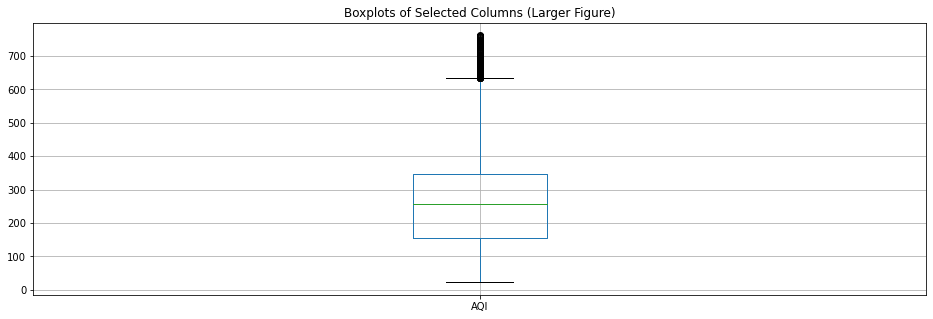

In [23]:
#checking for outliers in AQI
column_to_plot = ['AQI']  

# Create boxplots
plt.figure(figsize=(16, 5))
city_data[column_to_plot].boxplot()
plt.title('Boxplots of Selected Columns (Larger Figure)')
plt.show()

**Dealing with AQI outliers**

We decided to drop the any AQI with a value above 500 because according to the Air Quality Index Scale we can't have a value greater than 500.This action is justified because values in this range are not only extreme but also represent conditions that are exceedingly rare and could disproportionately affect the analysis.

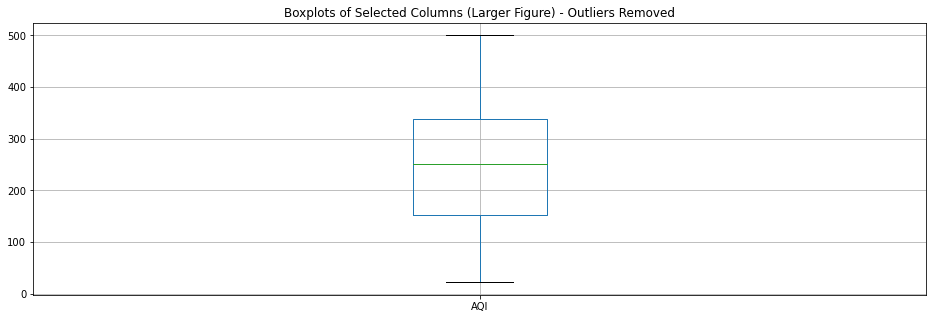

In [24]:
# Filter out rows where AQI exceeds 500
city_data_filtered = city_data[city_data['AQI'] <= 500]

# Create boxplots for with outliers removed
plt.figure(figsize=(16, 5))
city_data_filtered[column_to_plot].boxplot()
plt.title('Boxplots of Selected Columns (Larger Figure) - Outliers Removed')
plt.show()

**AQI_Bucket Outliers**

Outliers in the AQI Bucket column may indicate instances where AQI values fall outside the expected range for a particular category.
Detecting outliers in AQI Bucket can help identify cases where the categorization may not accurately reflect the actual air quality conditions, leading to potential discrepancies in risk assessment and policy decisions.

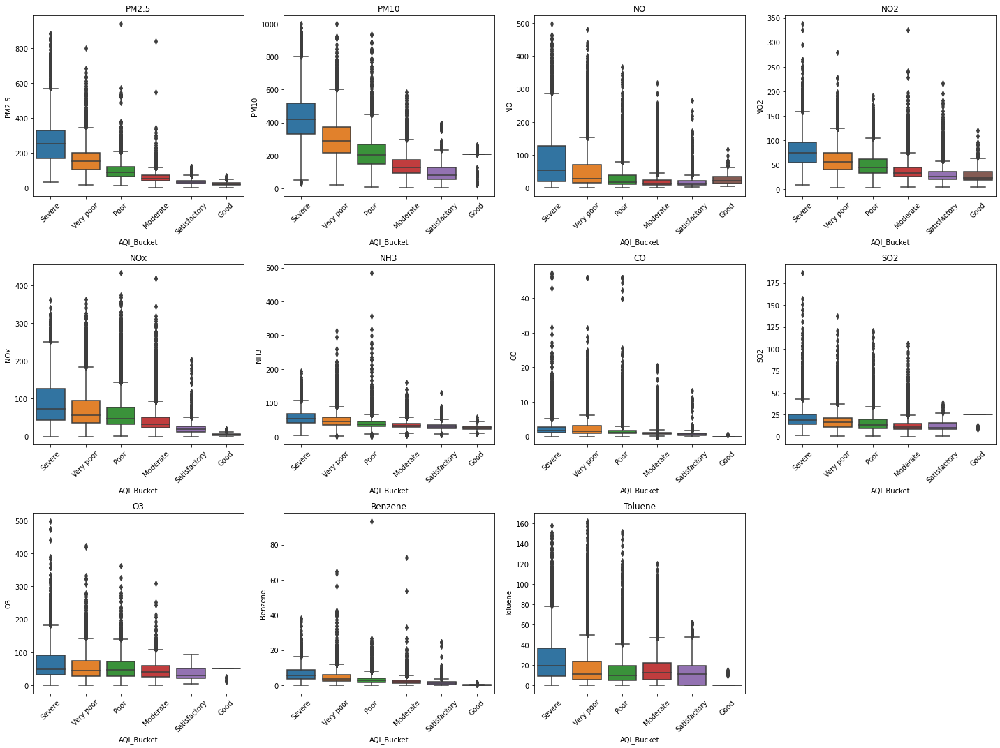

In [25]:
# Filter the dataset
selected_columns = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene','AQI_Bucket']
data_subset = city_data[selected_columns]

# Create box plots
plt.figure(figsize=(20, 15))
for i, column in enumerate(data_subset.drop("AQI_Bucket", axis=1).columns):
    plt.subplot(3, 4, i+1) 
    sns.boxplot(x="AQI_Bucket", y=column, data=data_subset)
    plt.title(column)
    plt.xticks(rotation=45) 
plt.tight_layout()
plt.show()

**Dealing with AQI_bucket outliers**

Decided to deal with the outliers using **Winsorizing**. This involves replacing extreme values with less extreme values.The method reduces the impact of outliers while retaining the information from the rest of the data.

The limit of (0.05, 0.05) for winsorization specifies that the lowest 5% and the highest 5% of data points will be replaced. The first 0.05 in the tuple indicates the proportion of data to be replaced from the lower end, and the second 0.05 indicates the proportion of data to be replaced from the upper end. This means:

Values below the 5th percentile are set to the value at the 5th percentile.

Values above the 95th percentile are set to the value at the 95th percentile.

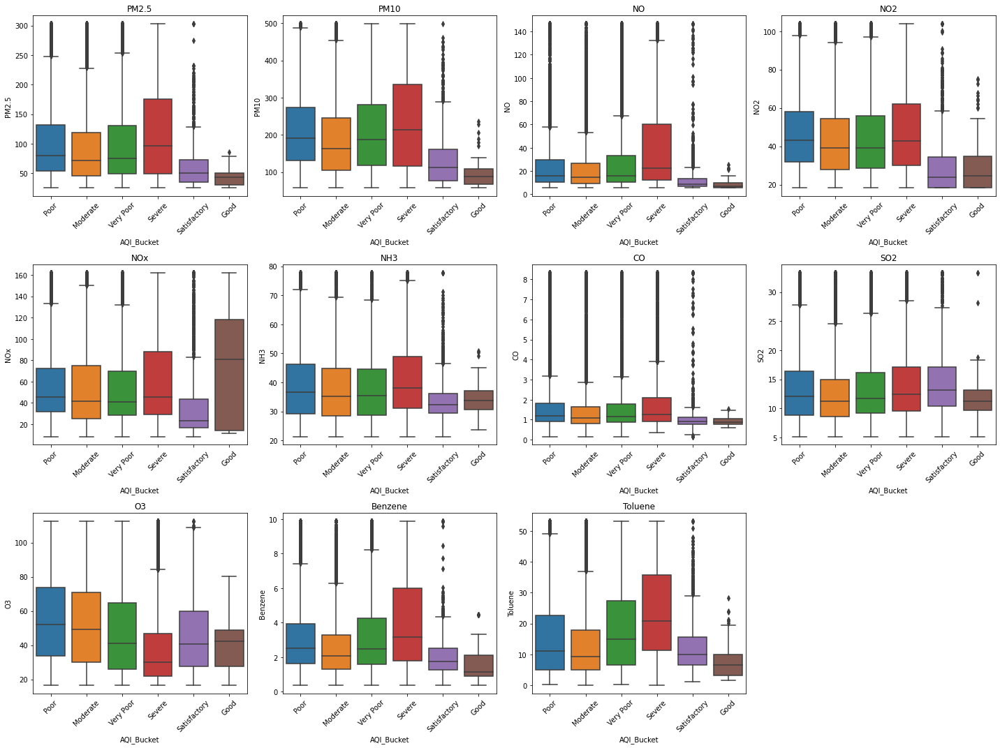

In [26]:
#performing winsorizing
selected_columns = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene']
data_subset = city_data[selected_columns]

# Define lower and upper limits for winsorizing 
limits = (0.05, 0.05)

# Apply winsorization to each selected column and create a new DataFrame for the winsorized data
winsorized_data = pd.DataFrame()
for column in data_subset.columns:
    winsorized_data[column] = winsorize(data_subset[column], limits=limits)

winsorized_data['AQI_Bucket'] = cityhour_df['AQI_Bucket']

# Visualization of the winsorized data
plt.figure(figsize=(20, 15))
for i, column in enumerate(winsorized_data.drop("AQI_Bucket", axis=1).columns):
    plt.subplot(3, 4, i+1)
    sns.boxplot(x="AQI_Bucket", y=column, data=winsorized_data)
    plt.title(column)
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## 3. EXPLORATORY DATA ANALYSIS(EDA)

*3.1 Univariate Analysis(Analysis of one variable)*

**Visualizing the distribution of the AQI_Bucket**

In [27]:
#visualizing variables and the unique values in the AQI_Bucket
class_counts = city_data.value_counts('AQI_Bucket')
class_counts

AQI_Bucket
Very poor       12462
Poor            12449
Moderate        12324
Severe           5967
Satisfactory     4371
Good              619
dtype: int64

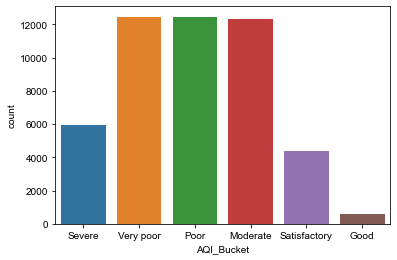

In [28]:
# bar graph for AQI_Bucket
sns.countplot(city_data.AQI_Bucket)
sns.set(rc={'figure.figsize':(10, 3)})

💡insights

-Very poor, Poor and Moderate categories have the highest counts (12462, 12449, 12324 respectively) are the majority classes 

-severe, satisfactory and good are the minority classes

**Visualizing the distribution of pollutants in Delhi**

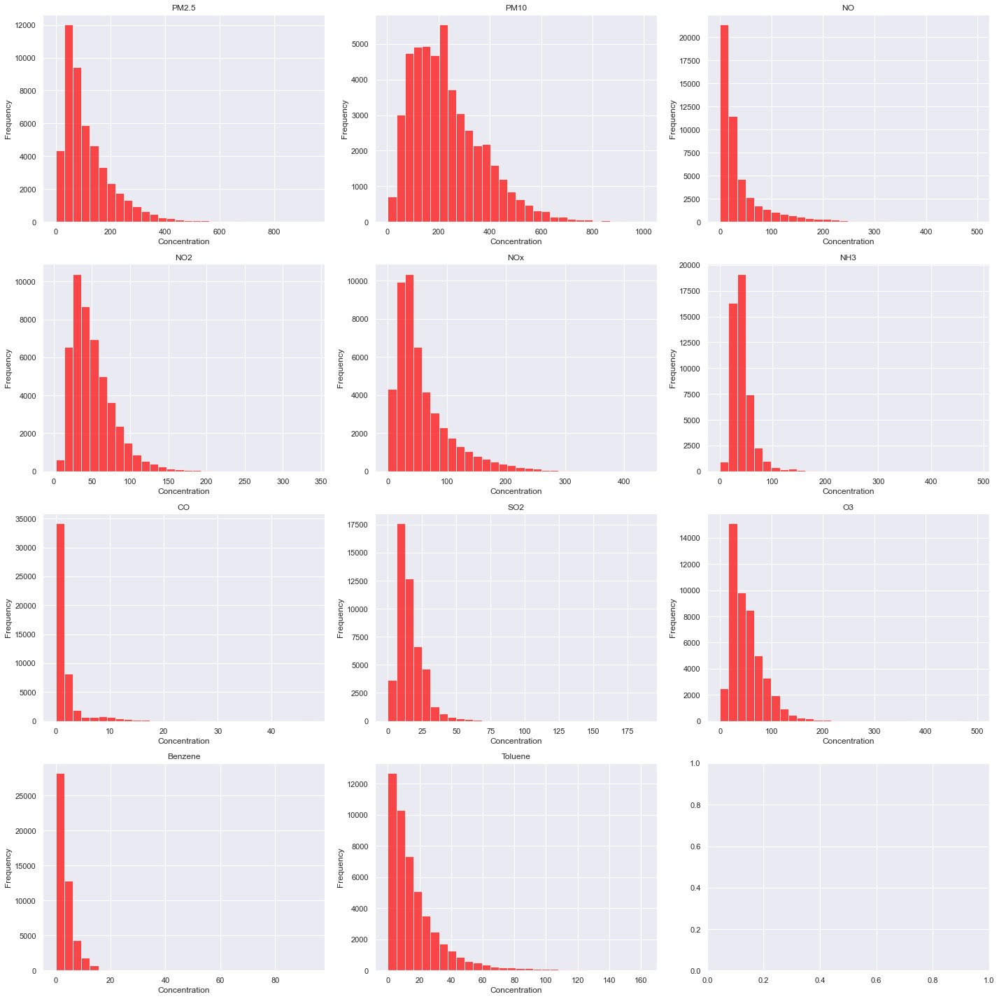

In [29]:
#state the pollutants
pollutants = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene']

# Define the number of rows and columns for subplots
num_rows = 4
num_cols = 3

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))

# Flatten the axes array to make it easier to iterate
axes = axes.flatten()

# Iterate over the pollutants and plot the histograms
for i, gas in enumerate(pollutants):
    ax = axes[i]
    ax.hist(city_data[gas], bins=30, color="Red", alpha=0.7)
    ax.set_title(gas)
    ax.set_xlabel('Concentration')
    ax.set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

💡insights

From my visualization and the basic description i had above, this is what i derived:

Gases that had the highest concentraion were:

-PM10: with a mean concentration of approximately 233.12 µg/m³.

-PM2.5: It has a mean concentration of approximately 117.08 µg/m³.

-O3: It has a mean concentration of approximately 51.29 µg/m³.

Gases with the lowest concentration were:

-co: with a mean concentration of approximately 1.97 µg/m³.

-Benzene: with a mean concentration of approximately 3.54 µg/m³.

**NOTE**

It appears that the variables are right skewed, since right tail of the histograms extends further out than the left tail.

Air quality data, especially pollutant concentrations, often exhibit right-skewed distributions where most data points are clustered at lower values with a long tail of higher values. Log transformation can help make these distributions more symmetric and easier to model.

*3.2 Bivariate Analysis(Analysis of Two Variables)*

**Visualize the AQI trend of Delhi from 2015-2020**

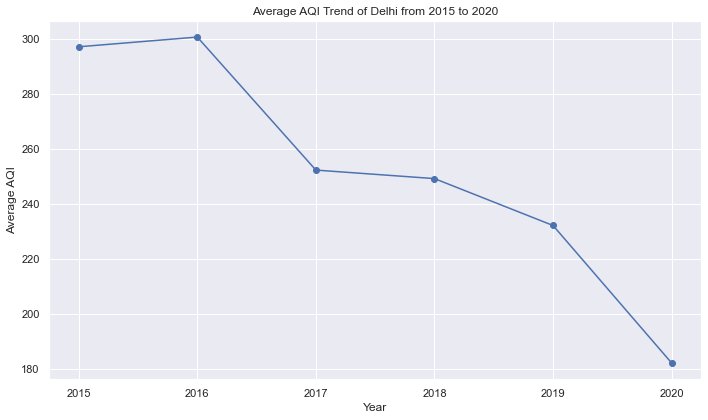

In [30]:
# Group the data by year and calculate the average AQI for each year
avg_aqi_by_year = city_data.groupby('Year')['AQI'].mean()

# Plot the AQI trend
plt.figure(figsize=(10, 6))
plt.plot(avg_aqi_by_year.index, avg_aqi_by_year.values, marker='o', linestyle='-')
plt.title('Average AQI Trend of Delhi from 2015 to 2020')
plt.xlabel('Year')
plt.ylabel('Average AQI')
plt.grid(True)
plt.xticks(avg_aqi_by_year.index)  # Set x-ticks to be the years
plt.tight_layout()
plt.show()


💡insights

-There seems to be a decreasing trend in the average AQI over the years. The AQI was highest in 2016(300) and gradually decreased over the following years, reaching its lowest point in 2020 (182)

-The decreasing trend in AQI suggests an improvement in air quality over time probably due to awareness creation around this challenge

*3.3 Multivariate Analysis(Analysis of more than two Variables)*

**Visualizing the correlation of the pollutants variable and AQI**

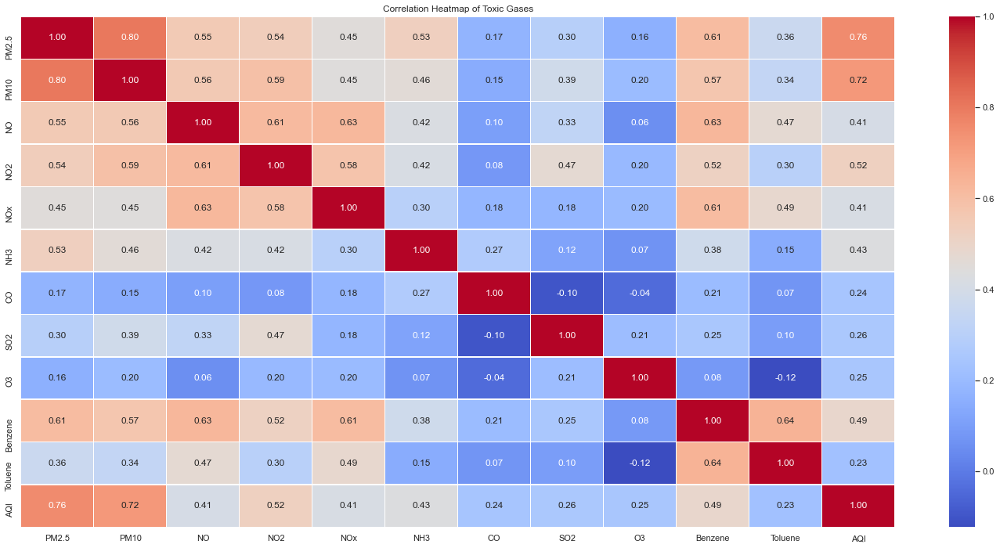

In [31]:
# Calculate the correlation matrix
corr = city_data[[i for i in city_data.columns if i not in ["AQI_Bucket","Date" ,"Year", "Month", "Day", "Hour"]]].corr()

# Plot the heatmap
plt.figure(figsize=(25, 12))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Toxic Gases')
plt.show()


In [32]:
#Display the correlation table
print(corr)

            PM2.5      PM10        NO       NO2       NOx       NH3        CO  \
PM2.5    1.000000  0.803130  0.552936  0.538506  0.449085  0.528880  0.173915   
PM10     0.803130  1.000000  0.558640  0.594437  0.446218  0.458161  0.147807   
NO       0.552936  0.558640  1.000000  0.614402  0.627234  0.423650  0.101592   
NO2      0.538506  0.594437  0.614402  1.000000  0.579642  0.415461  0.079504   
NOx      0.449085  0.446218  0.627234  0.579642  1.000000  0.301972  0.183263   
NH3      0.528880  0.458161  0.423650  0.415461  0.301972  1.000000  0.272579   
CO       0.173915  0.147807  0.101592  0.079504  0.183263  0.272579  1.000000   
SO2      0.298168  0.385381  0.326350  0.470239  0.180274  0.117817 -0.096047   
O3       0.160602  0.202924  0.055422  0.196668  0.197988  0.070215 -0.042079   
Benzene  0.610495  0.573422  0.627759  0.520028  0.612990  0.380784  0.206352   
Toluene  0.363813  0.335713  0.473563  0.299616  0.485109  0.148556  0.074724   
AQI      0.756538  0.720249 

💡insights

-PM2.5, PM10 and NO2 (0.75, 0.72 and 0.52 ) these pollutants show a strong  positive correlations with AQI.Higher levels of these pollutants tend to contribute to poorer air quality, leading to higher AQI values.

-O3 and O3(0.246 and 0.244) these pollutants show weaker positive correlations with AQI compared to others. While their correlations are not as strong as the previous pollutants, they still contribute to AQI levels to some extent, such as carbon monoxide's role in atmospheric chemistry or ozone's impact on respiratory health.

**Checking for Multicollinearity**

Multicollinearity occurs when independent variables in a regression model are highly correlated with each other. It can lead to unstable estimates of regression coefficients and reduce the interpretability of the model. By checking for multicollinearity, you ensure that the independent variables (pollutants) are sufficiently independent to provide reliable estimates of their effects on AQI.

In [33]:
# Set the correlation threshold
corr_threshold = 0.70

# Find pairs of features with correlation greater than the threshold
highly_correlated_pairs = []
for i in range(len(corr.columns)):
    for j in range(i):
        if abs(corr.iloc[i, j]) > corr_threshold:
            highly_correlated_pairs.append((corr.columns[i], corr.columns[j], corr.iloc[i, j]))

# Print highly correlated pairs
if len(highly_correlated_pairs) > 0:
    print("Highly correlated pairs:")
    for pair in highly_correlated_pairs:
        print(pair)
else:
    print("No highly correlated pairs found.")



Highly correlated pairs:
('PM10', 'PM2.5', 0.803130357909328)
('AQI', 'PM2.5', 0.7565383782188579)
('AQI', 'PM10', 0.7202487879319819)


In [34]:
# Drop PM10 from the dataset
city_data_filtered = city_data.drop('PM10', axis=1)

After identifying pairs of features with a correlation greater than a specified threshold (0.70) and dropping one of the highly correlated features(PM10) to reduce multicollinearity. This step is essential since it helps improve the stability and interpretability of models

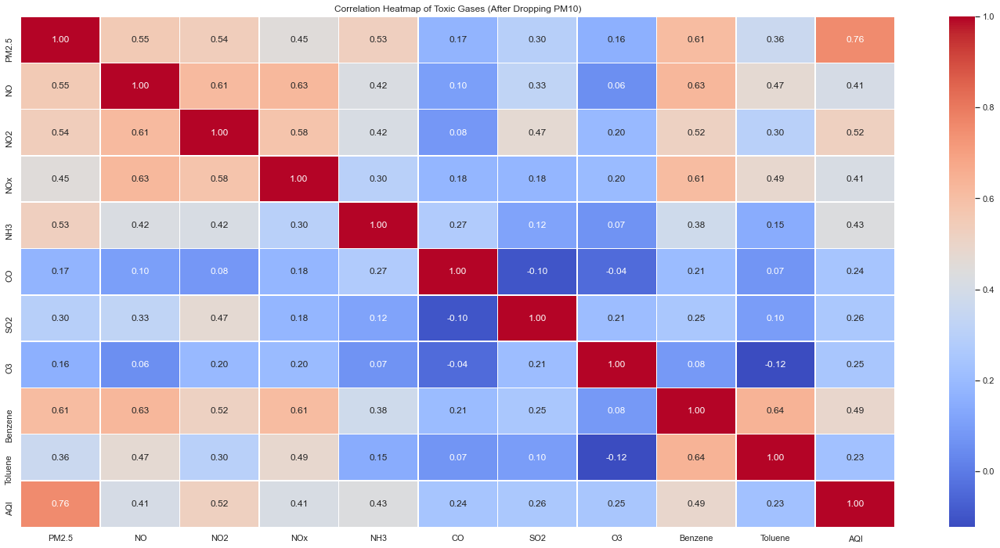

            PM2.5        NO       NO2       NOx       NH3        CO       SO2  \
PM2.5    1.000000  0.552936  0.538506  0.449085  0.528880  0.173915  0.298168   
NO       0.552936  1.000000  0.614402  0.627234  0.423650  0.101592  0.326350   
NO2      0.538506  0.614402  1.000000  0.579642  0.415461  0.079504  0.470239   
NOx      0.449085  0.627234  0.579642  1.000000  0.301972  0.183263  0.180274   
NH3      0.528880  0.423650  0.415461  0.301972  1.000000  0.272579  0.117817   
CO       0.173915  0.101592  0.079504  0.183263  0.272579  1.000000 -0.096047   
SO2      0.298168  0.326350  0.470239  0.180274  0.117817 -0.096047  1.000000   
O3       0.160602  0.055422  0.196668  0.197988  0.070215 -0.042079  0.208263   
Benzene  0.610495  0.627759  0.520028  0.612990  0.380784  0.206352  0.250858   
Toluene  0.363813  0.473563  0.299616  0.485109  0.148556  0.074724  0.097559   
AQI      0.756538  0.407251  0.523403  0.414073  0.430805  0.244547  0.258151   

               O3   Benzene

In [35]:
# Calculate the correlation matrix after dropping the 'PM10' column
corr_filtered = city_data_filtered[[i for i in city_data_filtered.columns if i not in ["AQI_Bucket","Date" ,"Year", "Month", "Day", "Hour", "PM10"]]].corr()

# Plot the heatmap using the filtered correlation matrix
plt.figure(figsize=(25, 12))
sns.heatmap(corr_filtered, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Toxic Gases (After Dropping PM10)')
plt.show()

# Display the correlation table after dropping 'PM10'
print(corr_filtered)


## 4. GEOGRAPHIC ANALYSIS

- Geographic analysis is important in understanding the spatial patterns of air quality for 2015 and 2020.This was achieved through creating a dual map with two layers: one showing the average AQI data for the year 2015 and the other showing the average AQI data for the year 2020. 

- By comparing AQI data between 2015 and 2020, we can identify trends in air quality over time in Delhi. This analysis helps us understand whether air quality has improved, deteriorated, or remained stable in different regions over the specified period.

In [36]:
#loading the csv file with the cities in India
indiacities_database =  pd.read_csv("India_Cities_database.csv")
indiacities_database.head()

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper
0,Delhi,28.6100,77.2300,India,IN,Delhi,admin,32226000,16753235
1,Mumbai,19.0761,72.8775,India,IN,Mahārāshtra,admin,24973000,12478447
2,Kolkāta,22.5675,88.3700,India,IN,West Bengal,admin,18502000,4496694
3,Bangalore,12.9789,77.5917,India,IN,Karnātaka,admin,15386000,8443675
4,Chennai,13.0825,80.2750,India,IN,Tamil Nādu,admin,12395000,6727000


In [37]:
# Merge the two dataframes based on city name
merged_df = pd.merge(city_data, indiacities_database, left_on='City', right_on='city', how='left')
merged_df.columns

Index(['City', 'Datetime', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO',
       'SO2', 'O3', 'Benzene', 'Toluene', 'AQI', 'AQI_Bucket', 'Year', 'Month',
       'Day', 'Hour', 'city', 'lat', 'lng', 'country', 'iso2', 'admin_name',
       'capital', 'population', 'population_proper'],
      dtype='object')

In [38]:
# Define the columns to keep

columns_to_keep = ['City', 'Year', 'lat', 'lng', 'AQI']

# Drop unnecessary columns
dual_map_df = merged_df[columns_to_keep].copy()

# Check the resulting DataFrame
dual_map_df.head()

,City,Year,lat,lng,AQI
0,Delhi,2015,28.61,77.23,456.0
1,Delhi,2015,28.61,77.23,456.0
2,Delhi,2015,28.61,77.23,456.0
3,Delhi,2015,28.61,77.23,456.0
4,Delhi,2015,28.61,77.23,456.0


In [39]:
# Check for missing values in lat and lng columns
missing_values = dual_map_df[['lat', 'lng']].isnull().sum()
print("Total missing values in 'lat' column:", missing_values['lat'])
print("Total missing values in 'lng' column:", missing_values['lng'])

Total missing values in 'lat' column: 0
Total missing values in 'lng' column: 0


calculate the average AQI for each city across the years 2015-2020

In [40]:
# Calculate the average AQI for each city across the years 2015-2020
df_mean_AQI = dual_map_df.groupby(['City', 'Year'])['AQI'].mean().round(0).reset_index()

creating a dual map containing two layers: one for displaying average AQI data for the year 2015 and another for displaying average AQI data for the year 2020

In [41]:
#Create dual map containing two layers: one for displaying average AQI data for the year 2015 and another for displaying average AQI data for the year 2020
m = plugins.DualMap(location=(20.5937, 78.9629), tiles=None, zoom_start=5)
# Add base tile layers
folium.TileLayer('Stamen Toner').add_to(m)
folium.TileLayer('openstreetmap').add_to(m)

In [42]:
# Create feature groups for the two years
fg_2015 = folium.FeatureGroup(name='2015').add_to(m.m1)
fg_2020 = folium.FeatureGroup(name='2020').add_to(m.m2)

In [43]:
# Iterate over the dataframe to add circle markers for both 2015 and 2020
for city, year, lat, lon, aqi in zip(dual_map_df['City'], dual_map_df['Year'], dual_map_df['lat'], dual_map_df['lng'], dual_map_df['AQI']):
    # Determine the radius based on the AQI value
    radius = 20 if aqi > 230 else 10
    
    if year == 2015:
        # Add circle marker for 2015
        folium.CircleMarker([lat, lon],
                            radius=radius,
                            icon=folium.Icon(color='red' if radius == 20 else 'blue'),
                            popup = ('<strong>City</strong>: ' + str(city).capitalize() + '<br>'
                                    '<strong>Year</strong>: ' + str(year) + '<br>'
                                    '<strong>AQI(Average)</strong>: ' + str(aqi) + '<br>'),
                            fill_color='red' if radius == 20 else 'blue',
                            fill_opacity=0.7 ).add_to(fg_2015)
    elif year == 2020:
        # Adjust the radius for 2020 based on the AQI value
        if aqi > 230:
            radius = 10
        else:
            radius = 5
        
        # Add circle marker for 2020
        folium.CircleMarker([lat, lon],
                            radius=radius,
                            icon=folium.Icon(color='red' if radius == 10 else 'blue'),
                            popup = ('<strong>City</strong>: ' + str(city).capitalize() + '<br>'
                                    '<strong>Year</strong>: ' + str(year) + '<br>'
                                    '<strong>AQI(Average)</strong>: ' + str(aqi) + '<br>'),
                            fill_color='red' if radius == 10 else 'blue',
                            fill_opacity=0.7 ).add_to(fg_2020)



In [44]:
# Add layer control
folium.LayerControl(collapsed=False).add_to(m)

# Display the map
m

💡insights

In the analysis:

Red Circle (larger radius): Indicates cities with a high average AQI value (> 230) for the respective year(2015). The larger the circle, the higher the AQI value, representing poorer air quality.

Blue Circle (smaller radius): Indicates cities with a moderate to low average AQI value (≤ 230) for the respective year(2020). The smaller the circle, the lower the AQI value, representing relatively better air quality.

We can clearly say that the average AQI value has decreased from 2015 to 2020, this suggests an improvement in air quality over time probably due to awareness creation around this challenge

# 5. TIME SERIES ANALYSIS

Time series analysis is a statistical technique used to analyze time-ordered data, where observations are recorded at regular intervals over time. It involves studying the pattern, structure, and behavior of the data to make forecasts, identify trends, detect seasonality, and understand underlying patterns or dependencies.

- FOR OUR ANALYSIS

Time series analysis is for identification of seasonality, trends and patterns in the data over time. It allows in predicting air quality levels based on past observations.

**Performing time series analysis for Delhi as it was our sample city**

 For our analysis we will limit the dataset from 2015 - 2018 as the period between 2019-2020 due to the unxpected shutdown because of covid 19 which ravaged Asia and the dip in AQI maybe attributed to it. Removing this period will show a true reflection of AQI trends

In [45]:
# Dropping rows past 2018-12-31
city_data_filtered = city_data_filtered.loc[city_data_filtered['Datetime'] <= '2018-12-31']
city_data_filtered.tail()

,City,Datetime,PM2.5,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket,Year,Month,Day,Hour
280207,Delhi,2018-12-30 20:00:00,280.87,144.25,103.62,183.71,56.69,3.42,20.26,31.28,9.24,74.59,511.0,Severe,2018,12,30,20
280208,Delhi,2018-12-30 21:00:00,392.74,177.30,99.83,210.14,62.98,4.12,19.78,38.46,11.54,80.69,512.0,Severe,2018,12,30,21
280209,Delhi,2018-12-30 22:00:00,449.43,191.57,102.41,223.21,69.71,4.50,20.45,34.41,13.33,88.03,515.0,Severe,2018,12,30,22
280210,Delhi,2018-12-30 23:00:00,499.72,203.40,95.74,232.55,72.83,4.61,21.56,38.27,14.64,101.04,515.0,Severe,2018,12,30,23
280211,Delhi,2018-12-31 00:00:00,541.11,196.81,88.61,224.70,71.86,4.95,19.76,47.29,14.66,105.54,515.0,Severe,2018,12,31,0


**a. Time Series Visualization to Understand its patterns, trends and seasonality**

*Yearly and Monthly Visualization*

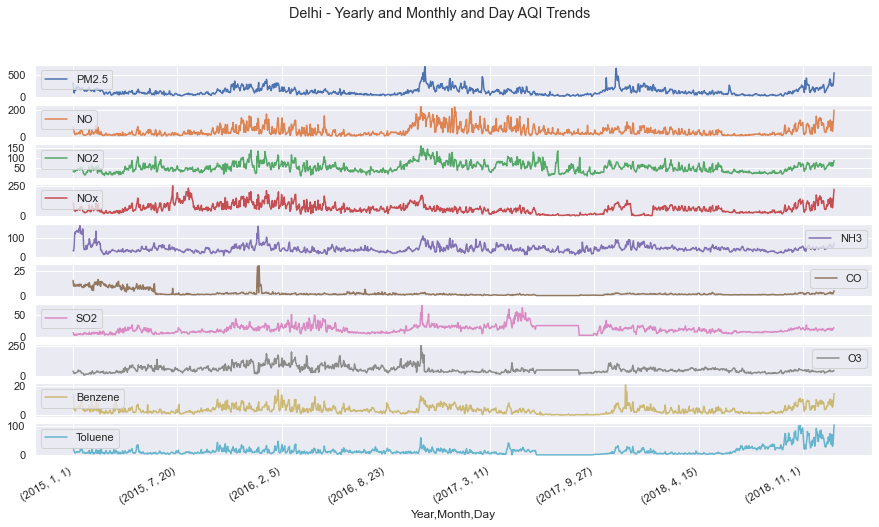

In [46]:
pollutants = ['PM2.5', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene']
def visualize_yearly_monthly(df, pollutants):
    # Group by yearly and monthly, calculate mean AQI for pollutants
    monthly_mean_pollutants = df.groupby(['Year', 'Month', 'Day'])[pollutants].mean()

    # Plotting yearly and monthly visualization for pollutants
    monthly_mean_pollutants.plot(kind='line', figsize=(15, 8), title=f'Delhi - Yearly and Monthly and Day AQI Trends', subplots=True)
    plt.show()

# Example usage
visualize_yearly_monthly(city_data_filtered, pollutants)


💡insights

-PM2.5, PM10, NO, NO2, NOx, NH3, CO, Benzene show a decreasing trend over time

-SO2, O3, Toluene show an increasing trend over time

*Hourly Visualization*

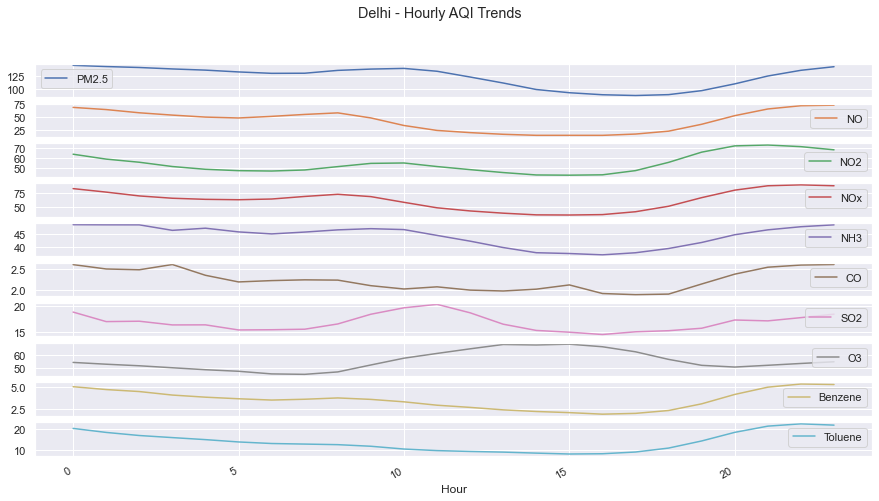

In [47]:
def visualize_hourly(df, pollutants):
    # Group by year, month, and hour, calculate mean AQI for pollutants
    hourly_mean_pollutants = df.groupby(['Hour'])[pollutants].mean()

    # Plotting hourly visualization for pollutants
    hourly_mean_pollutants.plot(kind='line', figsize=(15, 8), title='Delhi - Hourly AQI Trends', subplots=True)
    plt.show()

# Example usage
visualize_hourly(city_data_filtered, pollutants)

💡insights

-The hourly average AQI for PM2.5,NH3 and SO2 decrease over time, indicating that the concentration of fine particulate matter is generally decreasing over the observed hours. This could suggest a reduction in sources of PM2.5, NH3 and SO2 emissions or improved air quality management practices during these hours.

-The hourly average AQI for PM10, NO, NO2, NOx, O3, Benzene and Toluene exhibit an increasing trend, indicating a rise in the concentration over the observed hours. This could be attributed to various factors such as vehicular emissions, industrial activities, or other combustion processes during those hours.

In [48]:
#Making sure that index is set as Datetime
city_data_filtered.set_index('Datetime', inplace=True)

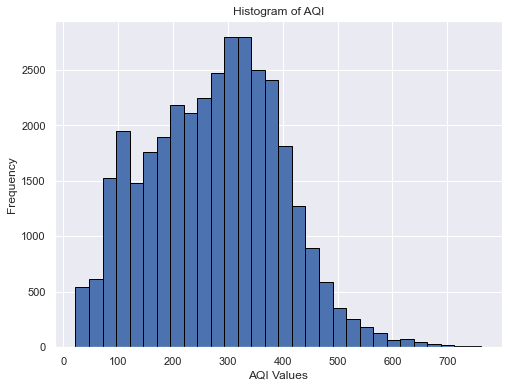

In [49]:
# Checking for skeweness
aqi_data = city_data_filtered['AQI']

# Create a histogram
plt.figure(figsize=(8, 6))
plt.hist(aqi_data, bins=30, edgecolor='black')
plt.title('Histogram of AQI')
plt.xlabel('AQI Values')
plt.ylabel('Frequency')
plt.show()

- From the histogram we noticed that our pollutants were rightly skewed and this may affect our time series analysis. Performed a Yeo Johnson transformation to normalize the data

**Log Transfromation**

In [50]:
# Apply Yeo-Johnson transformation
city_data_filtered["AQI_yeo"], lambda_value = yeojohnson(city_data_filtered['AQI'])

# Print the lambda value used for transformation
print("Lambda Value:", lambda_value)

Lambda Value: 0.7655831283701752


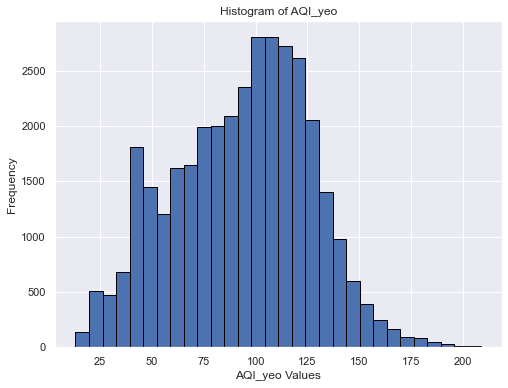

In [51]:
# Checking for skeweness in normalized data
aqi_data = city_data_filtered['AQI_yeo']

# Create a histogram
plt.figure(figsize=(8, 6))
plt.hist(aqi_data, bins=30, edgecolor='black')
plt.title('Histogram of AQI_yeo')
plt.xlabel('AQI_yeo Values')
plt.ylabel('Frequency')
plt.show()

**Checking for Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) Plots**

- Autocorrelation Function (ACF):

ACF indicates how similar a value is within a given time series and the previous value. (OR) It measures the degree of the similarity between a given time series and the lagged version of that time series at the various intervals we observed.

- Partial Autocorrelation Function (PACF):

PACF is similar to Auto-Correlation Function. It always shows the correlation of the sequence with itself with some number of time units per sequence order in which only the direct effect has been shown, and all other intermediary effects are removed from the given time series.

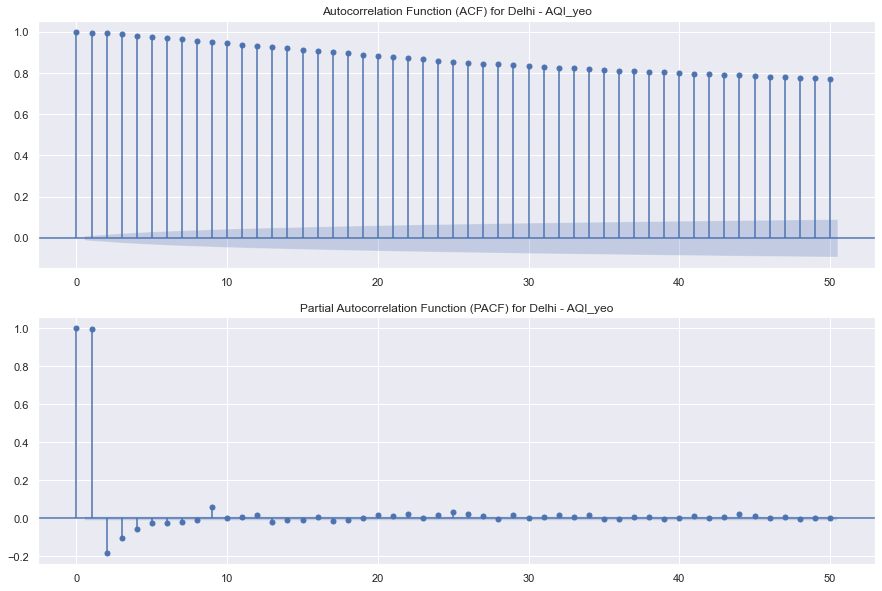

In [52]:
def plot_acf_pacf(df, pollutant):
    # Calculate ACF and PACF for the selected pollutant
    fig, ax = plt.subplots(2, figsize=(15, 10))
    plot_acf(df[pollutant], lags=50, ax=ax[0])
    plot_pacf(df[pollutant], lags=50, ax=ax[1])
    ax[0].set_title(f'Autocorrelation Function (ACF) for Delhi - {pollutant}')
    ax[1].set_title(f'Partial Autocorrelation Function (PACF) for Delhi - {pollutant}')
    plt.show()

# Example usage
pollutant_of_interest = 'AQI_yeo' 
plot_acf_pacf(city_data_filtered, pollutant_of_interest)



💡insights
- The ACF plot shows a pattern of slow, linear decay, it indicates non-stationarity in the mean, and differencing is required

**Seasonal Decomposition**

- Seasonal decomposition is a statistical technique used to break down a time series into its constituent components, typically trend, seasonality, and residual (or noise). The purpose is to understand the underlying patterns and fluctuations within the time series data.

- Decomposing the AQI allows you to analyze the overall trends and seasonality in air quality, which may reflect changes in pollution levels across multiple pollutants.

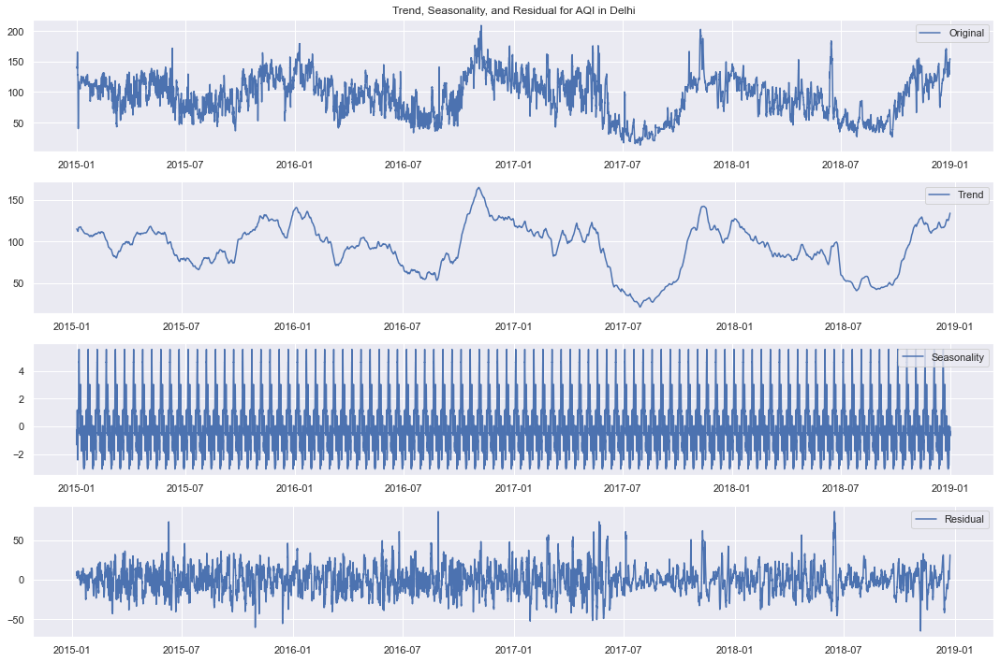

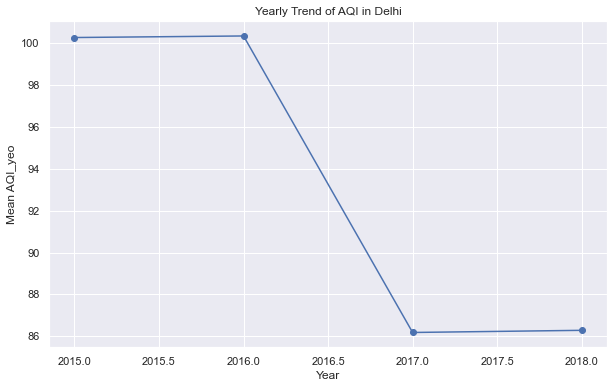

In [53]:
def seasonal_decomposition_over_years(city_data_filtered):
    # Filter DataFrame for the years 2015 to 2020
    filtered_df = city_data_filtered.loc[(city_data_filtered.index.year >= 2015) & (city_data_filtered.index.year <= 2018)]

    # Perform seasonal decomposition
    aqi_decomposition = seasonal_decompose(filtered_df['AQI_yeo'], model='additive', period=365)

    # Visualize the trend, seasonality, and residual
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 1, 1)
    plt.plot(filtered_df.index, filtered_df['AQI_yeo'], label='Original')
    plt.legend(loc='best')
    plt.title('Trend, Seasonality, and Residual for AQI in Delhi')

    plt.subplot(4, 1, 2)
    plt.plot(filtered_df.index, aqi_decomposition.trend, label='Trend')
    plt.legend(loc='best')

    plt.subplot(4, 1, 3)
    plt.plot(filtered_df.index, aqi_decomposition.seasonal, label='Seasonality')
    plt.legend(loc='best')

    plt.subplot(4, 1, 4)
    plt.plot(filtered_df.index, aqi_decomposition.resid, label='Residual')
    plt.legend(loc='best')

    plt.tight_layout()
    plt.show()

    # Visualize the trend over the years
    yearly_trend = filtered_df.groupby(filtered_df.index.year)['AQI_yeo'].mean()
    plt.figure(figsize=(10, 6))
    yearly_trend.plot(kind='line', marker='o', color='b')
    plt.title('Yearly Trend of AQI in Delhi')
    plt.xlabel('Year')
    plt.ylabel('Mean AQI_yeo')
    plt.grid(True)
    plt.show()

# Example usage
seasonal_decomposition_over_years(city_data_filtered)

**Differencing**

In [54]:
# Create a new column for the first-order differenced AQI data
city_data_filtered['AQI_differenced'] = city_data_filtered['AQI_yeo'].diff()

# Drop the first row with NaN due to differencing
city_data_filtered = city_data_filtered.dropna()

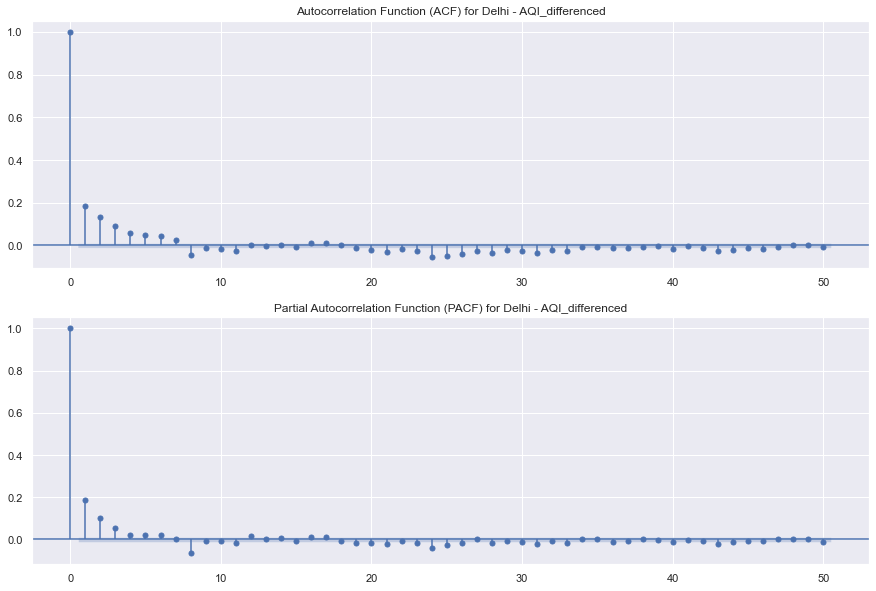

In [55]:
def plot_acf_pacf(df, pollutant):
    # Calculate ACF and PACF for the selected pollutant
    fig, ax = plt.subplots(2, figsize=(15, 10))
    plot_acf(df[pollutant], lags=50, ax=ax[0])
    plot_pacf(df[pollutant], lags=50, ax=ax[1])
    ax[0].set_title(f'Autocorrelation Function (ACF) for Delhi - {pollutant}')
    ax[1].set_title(f'Partial Autocorrelation Function (PACF) for Delhi - {pollutant}')
    plt.show()

# Example usage
pollutant_of_interest = 'AQI_differenced' 
plot_acf_pacf(city_data_filtered, pollutant_of_interest)

💡insights

-A good ACF typically shows the ACF drops to zero after a small number of lags, indicating the series is stationary

-A good PACF should show significant spikes at a few lags, with the remaining values tapering off to zero.
In the provided table, both ACF and PACF show a gradual decay, which is a desirable pattern for time series analysis.

**Performing Augmented Dickey-Fuller Test to Check For Stationarity**

The Augmented Dickey Fuller is used to check for stationarity.It is done with the following assumptions:

- Null Hypothesis (H0): Series is non-stationary
- Alternate Hypothesis (HA): Series is stationary
- p-value >0.05 Fail to reject (H0)
- p-value <= 0.05 Accept (H1)

In [56]:
#check for stationarity
def check_stationarity(df, pollutant):
    # Perform Dickey-Fuller test
    result = adfuller(df[pollutant])

    # Extracting test statistics and p-value
    test_statistic = result[0]
    p_value = result[1]

    # Print the results
    print('Dickey-Fuller Test Results for Delhi - AQI_differenced')
    print(f'Test Statistic: {test_statistic}')
    print(f'p-value: {p_value}')
    if p_value <= 0.05:
        print('Conclusion: Reject null hypothesis, data is stationary')
    else:
        print('Conclusion: Fail to reject null hypothesis, data is non-stationary')

# Example usage
pollutant_of_interest = 'AQI_differenced'  # Change this to the pollutant you want to analyze
check_stationarity(city_data_filtered, pollutant_of_interest)


Dickey-Fuller Test Results for Delhi - AQI_differenced
Test Statistic: -32.87516960414217
p-value: 0.0
Conclusion: Reject null hypothesis, data is stationary


 In this case, the p-value is very small, much less than 0.05. Therefore, we reject the null hypothesis. This means that there is strong evidence that the AQI data for the City is stationary.

**Split the dataset into Training and Testing Set**

In [57]:
# Define the function to split the dataset into training and testing sets
def split_data_hourly(df, test_size):
    train, test = train_test_split(df, test_size=test_size, shuffle=False)
    return train, test

# Split the data into training and testing sets
train_data, test_data = split_data_hourly(city_data_filtered, test_size=0.2)

# Print the size of the split datasets
print("Train data size:", train_data.shape)
print("Test data size:", test_data.shape)


Train data size: (28031, 19)
Test data size: (7008, 19)


For the time series the evaluation metrics were used for;

- Root Mean Squared Error (RMSE): RMSE to measure the average magnitude of the errors between predicted values and actual values. It gives a sense of how spread out the residuals are. Lower RMSE values indicate better model performance. 

- Mean Absolute Error (MAE): MAE is another measure of the accuracy of the model's predictions. It represents the average of the absolute errors between predicted and actual values. Similar to RMSE, lower MAE values indicate better model performance. 

- R-squared (R²): R-squared measures the proportion of the variance in the dependent variable (AQI) that is predictable from the independent variable(s) (predictions). It ranges from 0 to 1, where 1 indicates perfect predictions. Negative R-squared values typically indicate that the model is performing worse than a horizontal line. 

**ARIMA MODEL - BASELINE MODEL**

- The ARIMA (AutoRegressive Integrated Moving Average) model is a popular statistical method used for analyzing and forecasting time series data. It combines three components: AutoRegressive (AR), Integrated (I), and Moving Average (MA). 

In [58]:
# Define the function to fit ARIMA model, make predictions, and evaluate performance
def fit_arima_model(train_data, test_data, order):
    # Extract the AQI values from the training and test data
    train_aqi = train_data['AQI_differenced']
    test_aqi = test_data['AQI_differenced']
    
    # Fit the ARIMA model
    model = ARIMA(train_aqi, order=order)
    fitted_model = model.fit()
    
    # Make predictions
    predictions = fitted_model.forecast(steps=len(test_data))
    
    # Print model summary
    print("Model summary for Delhi")
    print(fitted_model.summary())
    
    # Calculate evaluation metrics
    rmse = np.sqrt(mean_squared_error(test_aqi, predictions))
    mae = mean_absolute_error(test_aqi, predictions)
    r_squared = r2_score(test_aqi, predictions)
    
    # Print evaluation metrics
    print("RMSE:", rmse)
    print("MAE:", mae)
    print("R-squared:", r_squared)
    
    return predictions

In [59]:
# Specify the order for the ARIMA model (p, d, q)
order = (4, 1, 1)

# Fit ARIMA model with the specified order and evaluate performance
predictions = fit_arima_model(train_data, test_data, order)

C:\Users\Mary\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'
C:\Users\Mary\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'
C:\Users\Mary\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'


Model summary for Delhi
                               SARIMAX Results                                
Dep. Variable:        AQI_differenced   No. Observations:                28031
Model:                 ARIMA(4, 1, 1)   Log Likelihood              -68440.236
Date:                Mon, 13 May 2024   AIC                         136892.473
Time:                        16:48:04   BIC                         136941.919
Sample:                    01-01-2015   HQIC                        136908.389
                         - 03-14-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1435      0.002     62.684      0.000       0.139       0.148
ar.L2          0.0797      0.003     24.297      0.000       0.073       0.086
ar.L3          0.0443      0

💡insights

-RMSE is approximately 1.14

-MAE is approximately 0.77

-R-squared is approximately 0.000115

From this we could see that the Arima model was not capturing the underlying pattern and dyamics of the AQI value effectively, we had to explore another model 

**FACEBOOK PROPHET**

- Facebook prophet is designed to make the process of forecasting time series data accessible, intuitive, and efficient for both experts and non-experts alike. Prophet is particularly well-suited for datasets with strong seasonal patterns, multiple seasonality, and holiday effects.

In [60]:
train_data.head()

,City,PM2.5,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket,Year,Month,Day,Hour,AQI_yeo,AQI_differenced
Datetime,,,,,,,,,,,,,,,,,,,
2015-01-01 02:00:00,Delhi,440.44,70.80,43.46,176.83,27.72,13.28,3.88,50.53,23.10,49.37,456.0,Severe,2015,1,1,2,140.728556,0.0
2015-01-01 03:00:00,Delhi,409.09,132.46,41.19,141.02,28.94,29.67,2.83,19.33,19.04,38.94,456.0,Severe,2015,1,1,3,140.728556,0.0
2015-01-01 04:00:00,Delhi,436.12,84.78,39.55,102.84,29.30,21.76,4.33,20.08,13.99,27.53,456.0,Severe,2015,1,1,4,140.728556,0.0
2015-01-01 05:00:00,Delhi,415.88,60.24,37.41,80.12,30.84,26.19,6.17,16.00,11.14,21.99,456.0,Severe,2015,1,1,5,140.728556,0.0
2015-01-01 06:00:00,Delhi,384.16,59.84,32.06,78.34,30.71,11.04,7.33,12.33,10.70,20.85,456.0,Severe,2015,1,1,6,140.728556,0.0


In [61]:
test_data.head()

,City,PM2.5,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket,Year,Month,Day,Hour,AQI_yeo,AQI_differenced
Datetime,,,,,,,,,,,,,,,,,,,
2018-03-14 01:00:00,Delhi,172.07,125.95,101.50,115.75,40.89,2.69,17.52,45.78,4.22,6.91,266.0,Poor,2018,3,14,1,92.818533,1.081463
2018-03-14 02:00:00,Delhi,160.43,87.51,113.49,94.30,34.32,2.66,12.95,47.90,5.78,4.83,270.0,Poor,2018,3,14,2,93.896204,1.077671
2018-03-14 03:00:00,Delhi,155.03,104.62,97.71,93.52,31.44,1.82,11.59,41.79,3.77,5.34,273.0,Poor,2018,3,14,3,94.702011,0.805807
2018-03-14 04:00:00,Delhi,154.47,100.27,91.22,124.31,40.23,2.39,16.03,37.92,4.19,5.13,277.0,Poor,2018,3,14,4,95.773211,1.071201
2018-03-14 05:00:00,Delhi,163.97,99.74,84.96,106.71,49.19,1.95,21.91,34.43,3.39,4.52,280.0,Poor,2018,3,14,5,96.574241,0.801030


**Fit Prophet model to the training data and make predictions**

In [62]:
from fbprophet import Prophet

def fit_prophet_model(train_data, test_data):
    # Prepare the data in the format expected by Prophet
    train_data_prophet = train_data.reset_index().rename(columns={'Datetime': 'ds', 'AQI_differenced': 'y'})
    test_data_prophet = test_data.reset_index().rename(columns={'Datetime': 'ds', 'AQI_differenced': 'y'})

    # Initialize Prophet model with tuned hyperparameters
    model = Prophet(changepoint_prior_scale=0.05, seasonality_mode='multiplicative', seasonality_prior_scale=10)

    # Fit the model on training data
    model.fit(train_data_prophet)

    # Make future dataframe for predictions
    future = model.make_future_dataframe(periods=len(test_data), freq='H')  # Adjust the frequency as per your data

    # Make predictions
    forecast = model.predict(future)

    # Extract predicted values for test period
    predictions = forecast[-len(test_data):]['yhat'].values

    # Calculate evaluation metrics
    rmse = np.sqrt(mean_squared_error(test_data_prophet['y'], predictions))
    mae = mean_absolute_error(test_data_prophet['y'], predictions)
    r_squared = r2_score(test_data_prophet['y'], predictions)

    # Ensure non-negative R-squared
    if r_squared < 0:
        r_squared = 0

    # Print evaluation metrics
    print("RMSE:", rmse)
    print("MAE:", mae)
    print("R-squared:", r_squared)

    return predictions

# Fit Prophet model and evaluate performance
predictions = fit_prophet_model(train_data, test_data)


RMSE: 1.148983991805148
MAE: 0.7781811727784964
R-squared: 0


💡insights

- Similar to the ARIMA model, the Prophet model also seems to have limitations in capturing the underlying patterns and dynamics of the AQI data, as indicated by the low R-squared value and relatively high RMSE and MAE values.


**Since both the ARIMA and Prophet models were exhibiting poor performance in forecasting the AQI data, there are several steps you can take to potentially improve the models, by Consider more sophisticated time series models that can capture complex patterns and dependencies in the data. Models like SARIMA (Seasonal ARIMA), VAR (Vector Autoregression), or LSTM (Long Short-Term Memory) neural networks. But due to time constraits we didn't get to address this issue**

**Predicting future Air Quality Trends for the years**

Since Prophet was atleast the best model when you compare the two, we used it to forecast until the year 2024
- we needed to calculate the number of hours or periods from your last observation in the train_data until the end of the year 2024

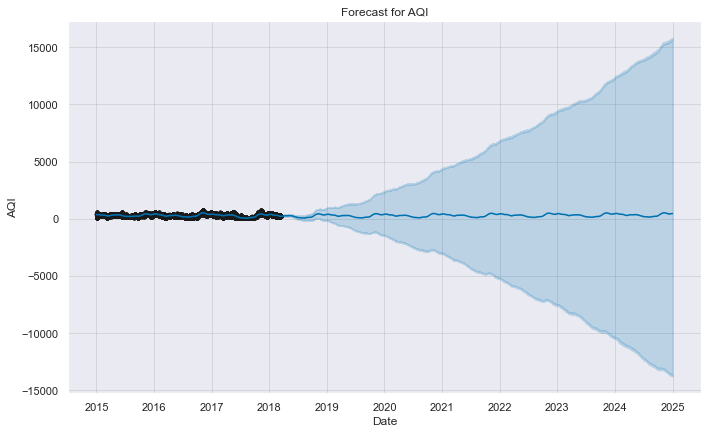

In [90]:
def forecast_prophet_model(train_data):

    # Prepare the data in required format for Prophet
    train_data = train_data.reset_index().rename(columns={'Datetime': 'ds', 'AQI': 'y'})

    # Initialize Prophet model
    model = Prophet()

    # Fit the model
    model.fit(train_data)

    # Calculate the forecast period until the end of 2024
    end_date = pd.to_datetime('2024-12-31')
    hours_until_2024 = (end_date - train_data['ds'].max()).days * 24  # Assuming hourly data

    # Make future predictions
    future = model.make_future_dataframe(periods=hours_until_2024, freq='H')
    forecast = model.predict(future)

    # Plot the forecast
    model.plot(forecast)
    plt.title('Forecast for AQI')
    plt.xlabel('Date')
    plt.ylabel('AQI')
    plt.show()
    
    return forecast

# Call the function to forecast future AQI values
forecast_prophet = forecast_prophet_model(train_data)


# 6. REGRESSION ANALYSIS

- Regression analysis is a statistical method used to examine the relationship between one or more independent variables (predictors) and a dependent variable (outcome). It aims to understand how the value of the dependent variable changes as the values of the independent variables change.

- Regression analysis helps in understanding the relationship between AQI (dependent variables) and the pollutants (independent variables).This will quantify the impact of these factors on air quality and identify significant predictors.

- The goal of regression analysis in this context would be to understand changes in pollutant concentrations and how it affects AQI

**4. DATA PREPARATION FOR MODELLING**

*4.1 Define X and y variable*

-y_variable(Target variable) = AQI

-X_variables = the pollutants(PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene)	

In [91]:
#extract the dependent and independent variables
X = city_data_filtered[['PM2.5', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene']]
y = city_data_filtered['AQI']

4.3 Log transformation

In [92]:
# Define the variables to be log-transformed
variables_to_transform = ['PM2.5', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene']

In [93]:
# Apply log transformation to the selected variables
X_log_transformed = X[variables_to_transform].apply(np.log1p)

In [94]:
# Concatenate the log-transformed variables with the rest of the data
X_transformed = pd.concat([X.drop(columns=variables_to_transform), X_log_transformed], axis=1)

*4.4 Perform train and test split*

In [95]:
# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

*4.5 Feature Scaling*

In [96]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to the training data and transform the training data
X_train_scaled = scaler.fit_transform(X_train)

# Transform the test data using the same scaler
X_test_scaled = scaler.transform(X_test)

In [97]:
# Print the shapes of the scaled train and test sets
print("Scaled Train set - X:", X_train_scaled.shape," y:", y_train.shape)
print("Scaled Test set - X:", X_test_scaled.shape ," y:", y_test.shape)

Scaled Train set - X: (28031, 10)  y: (28031,)
Scaled Test set - X: (7008, 10)  y: (7008,)


for my Regression Analysis
- R-squared (R²):

A higher R-squared value indicates that more variability in the AQI values is explained by the model, suggesting a better fit

- Root Mean Squared Error (RMSE):

lower values of RMSE indiCate better performance, as they represent the average deviation of predicted AQI values from the actual values


- Mean Absolute Error (MAE):

lower values of MAE indicate better performance


**Linear Regression(Baseline Model)**

- Linear Regressor:

Linear Regressor is a simple, linear approach to modeling the relationship between a dependent variable and one or more independent variables. It assumes that the relationship between the variables can be described by a linear equation, where the dependent variable is a linear combination of the independent variables plus an error term. The goal of linear regression is to find the best-fitting line that minimizes the sum of the squared differences between the observed and predicted values.

*Initialize and fit the linear regression model*

In [98]:
# Initialize and fit the Linear Regression model
lr_model_scaled = LinearRegression()
lr_model_scaled.fit(X_train_scaled, y_train)

LinearRegression()

*Generate predictions on the test set*

In [99]:
# Make predictions
y_pred_lr_scaled = lr_model_scaled.predict(X_test_scaled)

*calculate the evaluation metric*

In [100]:
# Calculate evaluation metrics
rmse_lr_scaled = np.sqrt(mean_squared_error(y_test, y_pred_lr_scaled))
mae_lr_scaled = mean_absolute_error(y_test, y_pred_lr_scaled)
r_squared_lr_scaled = r2_score(y_test, y_pred_lr_scaled)

*Display the evaluation metrics*

In [101]:
# Print evaluation metrics
print("Linear Regression Evaluation Metrics with Scaling:")
print("RMSE:", rmse_lr_scaled)
print("MAE:", mae_lr_scaled)
print("R-squared:", r_squared_lr_scaled)

Linear Regression Evaluation Metrics with Scaling:
RMSE: 70.79370408637847
MAE: 55.0282601742179
R-squared: 0.6617425453399701


💡insights

These model suggest 
performance. While the R-squared value indicates that approximately 67% of the variability in AQI values is explained by the model, the RMSE and MAE values could be further reduced for better accuracy.

*visualization of scatter plots*

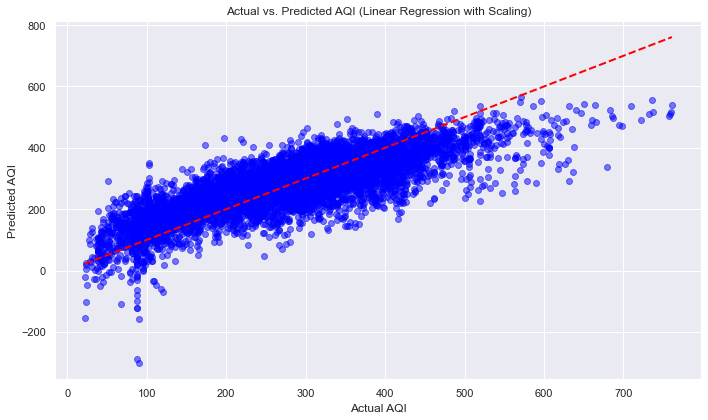

In [102]:
# Create scatter plot of actual vs. predicted AQI values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_lr_scaled, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', lw=2)
plt.title('Actual vs. Predicted AQI (Linear Regression with Scaling)')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.grid(True)
plt.tight_layout()
plt.show()


In [103]:
# Create a DataFrame with actual and predicted AQI values for linear regression
scatter_data = pd.DataFrame({
    'Actual AQI': y_test,
    'Predicted AQI': y_pred_lr_scaled
})

# Display the DataFrame
print(scatter_data.head(10))


                     Actual AQI  Predicted AQI
Datetime                                      
2017-11-29 16:00:00       371.0     289.484718
2015-02-07 10:00:00       327.0     338.797780
2018-05-08 15:00:00       232.0     164.601703
2018-09-24 15:00:00        65.0     119.387286
2018-09-27 20:00:00       168.0     229.239866
2018-03-17 04:00:00       251.0     284.643873
2018-05-22 13:00:00       223.0     280.482918
2017-02-10 13:00:00       300.0     258.842194
2018-05-02 06:00:00       148.0     186.116324
2015-02-08 18:00:00       320.0     304.999100


💡insights

-The predicted AQI values are generally higher than the actual AQI values. This suggests that the model tends to overestimate the AQI.

-There is some variation in the predictions, as seen from the spread of the points around the line of perfect prediction (the red dashed line).

-Some points fall close to the line, indicating accurate predictions, while others are farther away, indicating larger prediction errors..

**Random Forest Regressor**

- Random Forest Regressor:

Random Forest Regressor is an ensemble learning method used for regression tasks. It operates by constructing a multitude of decision trees during training and outputting the average prediction of the individual trees for regression. Each tree in the ensemble is trained on a random subset of the training data, and during prediction, the output is the average prediction of all the trees in the forest.

*Initialize and fit the Random Forest regression model*

In [104]:
# Initialize and fit the Random Forest Regressor model
rf_model_scaled = RandomForestRegressor(random_state=42)

rf_model_scaled.fit(X_train_scaled, y_train)

RandomForestRegressor(random_state=42)

*Generate predictions on the test set*

In [105]:
# Make predictions
y_pred_rf_scaled = rf_model_scaled.predict(X_test_scaled)

*calculate the evaluation metric*

In [106]:
# Calculate evaluation metrics
rmse_rf_scaled = np.sqrt(mean_squared_error(y_test, y_pred_rf_scaled))
mae_rf_scaled = mean_absolute_error(y_test, y_pred_rf_scaled)
r_squared_rf_scaled = r2_score(y_test, y_pred_rf_scaled)

*Display the evaluation metrics*

In [107]:
# Print evaluation metrics
print("Random Forest Regression Evaluation Metrics with Scaling:")
print("RMSE:", rmse_rf_scaled)
print("MAE:", mae_rf_scaled)
print("R-squared:", r_squared_rf_scaled)

Random Forest Regression Evaluation Metrics with Scaling:
RMSE: 51.78722500395043
MAE: 37.38773509231089
R-squared: 0.8189896598565697


💡insights

-These metrics suggest good performance. The higher R-squared value(82%) indicates a better fit of the model to the data.

-The lower RMSE and MAE values indicate less average deviation of predicted AQI values from the actual values.

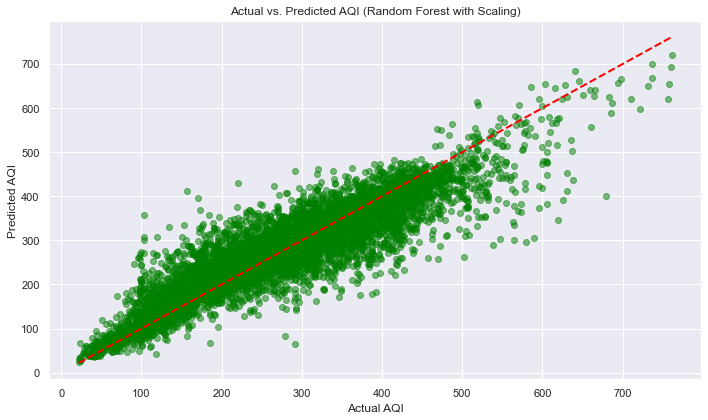

In [108]:
# Create scatter plot of actual vs. predicted AQI values for Random Forest
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_rf_scaled, color='green', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', lw=2)
plt.title('Actual vs. Predicted AQI (Random Forest with Scaling)')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.grid(True)
plt.tight_layout()
plt.show()


In [109]:
# Create a DataFrame with actual and predicted AQI values for Random Forest
scatter_data_rf = pd.DataFrame({
    'Actual AQI': y_test,
    'Predicted AQI': y_pred_rf_scaled
})

# Display the DataFrame
print(scatter_data_rf.head(10))


                     Actual AQI  Predicted AQI
Datetime                                      
2017-11-29 16:00:00       371.0         307.92
2015-02-07 10:00:00       327.0         336.22
2018-05-08 15:00:00       232.0         207.15
2018-09-24 15:00:00        65.0          69.97
2018-09-27 20:00:00       168.0         153.71
2018-03-17 04:00:00       251.0         255.63
2018-05-22 13:00:00       223.0         287.69
2017-02-10 13:00:00       300.0         313.13
2018-05-02 06:00:00       148.0         200.89
2015-02-08 18:00:00       320.0         281.45


In [110]:
# Extract feature importances from the Random Forest Regression model
feature_importances = rf_model_scaled.feature_importances_

# Create a DataFrame to display feature importances along with the corresponding pollutant names
feature_importance_df = pd.DataFrame({
    'Pollutant': X_train.columns,
    'Feature Importance': feature_importances
})

# Sort the DataFrame by feature importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Feature Importance', ascending=False)

# Display the DataFrame
print(feature_importance_df)


  Pollutant  Feature Importance
0     PM2.5            0.611085
9   Toluene            0.121927
5        CO            0.039869
2       NO2            0.038593
6       SO2            0.038309
7        O3            0.036695
4       NH3            0.034896
8   Benzene            0.027963
1        NO            0.025336
3       NOx            0.025327


💡insights

The dominance of PM2.5 in determining AQI highlights its significant contribution to air pollution.

**GradientBoosting Regressor**

- Gradient Boosting Regressor:

Gradient Boosting Regressor is a machine learning technique used for regression tasks. It builds an ensemble of weak prediction models, typically decision trees, in a sequential manner. Each new model in the ensemble is trained to correct the errors made by the existing ensemble of models. The learning process is guided by minimizing a loss function, such as mean squared error, and the final prediction is a weighted sum of the predictions of all the models in the ensemble.

*Initialize and fit the Gradient Boosting regression model*

In [111]:
# Initialize and fit the Gradient Boosting Regressor model
gb_model_scaled = GradientBoostingRegressor(random_state=42)

gb_model_scaled.fit(X_train_scaled, y_train)

GradientBoostingRegressor(random_state=42)

*Generate predictions on the test set*

In [112]:
# Make predictions
y_pred_gb_scaled = gb_model_scaled.predict(X_test_scaled)

*calculate the evaluation metric*

In [113]:
# Calculate evaluation metrics
rmse_gb_scaled = np.sqrt(mean_squared_error(y_test, y_pred_gb_scaled))
mae_gb_scaled = mean_absolute_error(y_test, y_pred_gb_scaled)
r_squared_gb_scaled = r2_score(y_test, y_pred_gb_scaled)

*Display the evaluation metrics*

In [114]:
# Print evaluation metrics
print("Gradient Boosting Regression Evaluation Metrics with Scaling:")
print("RMSE:", rmse_gb_scaled)
print("MAE:", mae_gb_scaled)
print("R-squared:", r_squared_gb_scaled)

Gradient Boosting Regression Evaluation Metrics with Scaling:
RMSE: 60.19870434473847
MAE: 45.40574304328812
R-squared: 0.7554135507634523


💡insights

These metrics also suggest good performance, although slightly less than Random Forest. 

The R-squared value is still relatively high(75%) but low compared to random forest

The RMSE and MAE values are higher compared to Random Forest, indicating slightly higher average deviation, but  indicating a good fit.

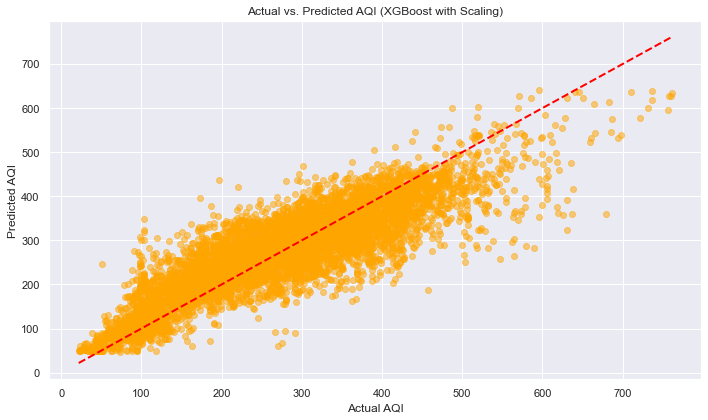

In [115]:
# Create scatter plot of actual vs. predicted AQI values for XGBoost
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_gb_scaled, color='orange', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', lw=2)
plt.title('Actual vs. Predicted AQI (XGBoost with Scaling)')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.grid(True)
plt.tight_layout()
plt.show()


In [116]:
# Create a DataFrame with actual and predicted AQI values for XGBoost
scatter_data_xgb = pd.DataFrame({
    'Actual AQI': y_test,
    'Predicted AQI': y_pred_gb_scaled
})

# Display the DataFrame
print(scatter_data_xgb.head(10))


                     Actual AQI  Predicted AQI
Datetime                                      
2017-11-29 16:00:00       371.0     291.593544
2015-02-07 10:00:00       327.0     328.319087
2018-05-08 15:00:00       232.0     195.785137
2018-09-24 15:00:00        65.0      97.477970
2018-09-27 20:00:00       168.0     190.300191
2018-03-17 04:00:00       251.0     284.050252
2018-05-22 13:00:00       223.0     301.020864
2017-02-10 13:00:00       300.0     301.702187
2018-05-02 06:00:00       148.0     204.759610
2015-02-08 18:00:00       320.0     317.520707


💡insights

-The predicted AQI values are also generally closer to the actual AQI values compared to Linear Regression, but slightly less so compared to Random Forest.

-Similar to Random Forest, there is less variation in the predictions compared to Linear Regression, with the points clustering more tightly around the line of perfect prediction.

-Overall, the points are closer to the line, indicating smaller prediction errors, but there may be slightly more spread compared to Random Forest.

# CONCLUSION

**Based on the time series analysis:**

- PM2.5, PM10, NO, NO2, NOx, NH3, and Benzene show a decreasing trend over time.
- SO2, O3, and Toluene show an increasing trend over time.
- Hourly average AQI for PM2.5, NH3, and SO2 decreased over time, suggesting potential reductions in emissions or improved air quality management.
- Hourly average AQI for PM10, NO, NO2, NOx, O3, Benzene, and Toluene exhibited an increasing trend, indicating rising concentrations over observed hours, possibly due to various factors like vehicular emissions or industrial activities.

- Both the ARIMA and Prophet models were applied for forecasting AQI.

- The ARIMA model showed an RMSE of approximately 1.14, MAE of approximately 0.77, and an R-squared value close to zero.

- The Prophet model exhibited similar performance, with an RMSE of approximately 1.15, MAE of approximately 0.78, and an R-squared value close to zero.

- Neither model effectively captured the underlying patterns and dynamics of AQI data, suggesting limitations in forecasting accuracy.

- Despite the limitations, more advanced time series models like SARIMA, VAR, or LSTM could be explored to improve forecasting accuracy.

- Due to time constraints, further model refinement was not conducted.

- The Prophet model was used to forecast AQI trends until the end of 2024, providing insights into potential air quality trajectories beyond the analyzed period.

**Based on the Regression analysis:**

- Regression analysis was conducted to understand the relationship between various pollutants (independent variables) and Air Quality Index (AQI) values (dependent variable). The analysis aimed to quantify the impact of pollutants on air quality and identify significant predictors.

- Data preparation involved defining the target variable (AQI) and the independent variables (pollutants), performing log transformation on the data, and splitting the dataset into training and testing sets. Feature scaling was also applied to standardize the data.

- The Linear Regression model yielded an R-squared value of approximately 66%, indicating moderate explanatory power. However, the RMSE and MAE values were relatively high, suggesting room for improvement in prediction accuracy.

- In contrast, the Random Forest Regression model performed better, with an R-squared value of around 82%. The lower RMSE and MAE values indicated less average deviation of predicted AQI values from the actual values, indicating a better fit.

- Additionally, Gradient Boosting Regression was applied, yielding an R-squared value of approximately 75%. While slightly lower than Random Forest, it still demonstrated good performance.

- Feature importance analysis revealed that PM2.5 was the most influential pollutant in determining AQI, highlighting its significant contribution to air pollution.

- Overall, both Random Forest and Gradient Boosting Regression models showed promise in predicting AQI values, with Random Forest performing slightly better in terms of accuracy. Visualizations of scatter plots further illustrated the relationship between actual and predicted AQI values for each model, providing insights into prediction errors and model performance.


# RECOMMENDATION

- Enhanced Pollutant Monitoring: Given the significant impact of pollutants such as CO, PM2.5, PM10, NO, NO2, and SO2 on AQI, there should be intensified efforts to monitor and regulate the emissions of these pollutants. This could involve deploying advanced sensor networks, leveraging satellite data for comprehensive coverage, and implementing stricter emission standards for industries and vehicles.

- Proactive Mitigation Measures: Governments and relevant authorities should implement proactive measures to mitigate the emission of pollutants identified as major contributors to poor air quality. This could include investing in cleaner energy sources, promoting public transportation and electric vehicles, and enforcing regulations to reduce industrial emissions.

- Adoption of Prophet for Forecasting: The adoption of Prophet as the preferred model for forecasting AQI is recommended due to its superior performance compared to ARIMA and SARIMA models. Continuous refinement and calibration of the Prophet model should be undertaken to improve its accuracy and reliability further.

- Utilization of Random Forest Regression: Given its superior performance in predicting AQI and explaining variance, the Random Forest Regression model should be utilized for predictive modeling of air quality. However, continuous monitoring and fine-tuning of the model parameters are essential to ensure its effectiveness over time.

- Investment in Research and Development: Continued investment in research and development is crucial to identify emerging pollutants, understand their impact on air quality, and develop innovative technologies and strategies for their mitigation. Collaborative efforts between governments, research institutions, and industries can lead to the development of effective solutions for improving air quality.

- Public Awareness and Participation: Public awareness campaigns and community engagement initiatives should be conducted to educate individuals about the sources and effects of air pollution. Encouraging behavior changes such as reducing vehicle idling, practicing energy conservation, and supporting green initiatives can empower individuals to contribute to air quality improvement efforts.

- Policy Support and Implementation: Policymakers should prioritize air quality management and enact policies that address the root causes of air pollution effectively. This may involve incentivizing the adoption of clean technologies, imposing penalties for non-compliance with emission standards, and fostering international cooperation to tackle transboundary air pollution issues.